In [1]:
%pylab inline
%load_ext autoreload
%autoreload 2

from __future__ import division
from __future__ import print_function

import os
import copy
import argparse
import fnmatch
import numpy as np

import scipy
from scipy.interpolate import interp1d

# Astropy
from astropy.io import fits
from astropy    import units as u
from astropy.stats import sigma_clip
# AstroML
from astroML.plotting import hist

# Matplotlib related
# Matplotlib default settings
rcdef = plt.rcParams.copy()
pylab.rcParams['figure.figsize'] = 12, 10
pylab.rcParams['xtick.major.size'] = 8.0
pylab.rcParams['xtick.major.width'] = 2.5
pylab.rcParams['xtick.minor.size'] = 4.0
pylab.rcParams['xtick.minor.width'] = 2.5
pylab.rcParams['ytick.major.size'] = 8.0
pylab.rcParams['ytick.major.width'] = 2.5
pylab.rcParams['ytick.minor.size'] = 4.0
pylab.rcParams['ytick.minor.width'] = 2.5
pylab.rcParams['legend.numpoints'] = 1

import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from matplotlib.ticker import NullFormatter
from matplotlib.ticker import MaxNLocator

# Shapely related imports
from shapely.geometry import Polygon, LineString, Point
from shapely          import wkb
from shapely.ops      import cascaded_union

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python2.7/site-packages/IPython/kernel/__init__.py:13: ShimWarning: The `IPython.kernel` package has been deprecated. You should import from ipykernel or jupyter_client instead.
  "You should import from ipykernel or jupyter_client instead.", ShimWarning)


In [1]:
def polyReadWkb(wkbName, load=True):
    """Read a .wkb file into a Polygon shape."""
    wkbFile = open(wkbName, 'r')
    polyWkb = wkbFile.read().decode('hex')
    wkbFile.close()

    if load is True:
        return wkb.loads(polyWkb)
    else:
        return polyWkb

In [8]:
g09_wkb = 'ssp385_wide_g09_tract_all.wkb'
g09_hsc = 'hsc_gama_g09_hsc_match.fits'
g09_match = 'hsc_gama_dr15a_g09_matched.fits'
g09_not_match = 'hsc_gama_dr15a_g09_not_matched.fits'
g09_red = 'redmapper/hsc_redmapper_g09.fits'

In [9]:
g15_wkb = 'ssp385_wide_g15_tract_all.wkb'
g15_hsc = 'hsc_gama_g15_hsc_match.fits'
g15_match = 'hsc_gama_dr15a_g15_matched.fits'
g15_not_match = 'hsc_gama_dr15a_g15_not_matched.fits'
g15_red = 'redmapper/hsc_redmapper_g15.fits'

In [10]:
w12_wkb = 'ssp385_wide_w12_tract_all.wkb'
w12_hsc = 'hsc_gama_w12_hsc_match.fits'
w12_match = 'hsc_gama_dr15a_w12_matched.fits'
w12_not_match = 'hsc_gama_dr15a_w12_not_matched.fits'
w12_red = 'redmapper/hsc_redmapper_w12.fits'

In [11]:
gama_match = 'hsc_gama_dr15a_matched.fits'
gama_nomatch = 'hsc_gama_dr15a_not_matched.fits'

# Distribution of Galaxies in G09

In [26]:
g09Wkb = polyReadWkb(g09_wkb, load=True)
g09Red = fits.open(g09_red)[1].data

g09Match = fits.open(g09_match)[1].data
g09NoMatch = fits.open(g09_not_match)[1].data 

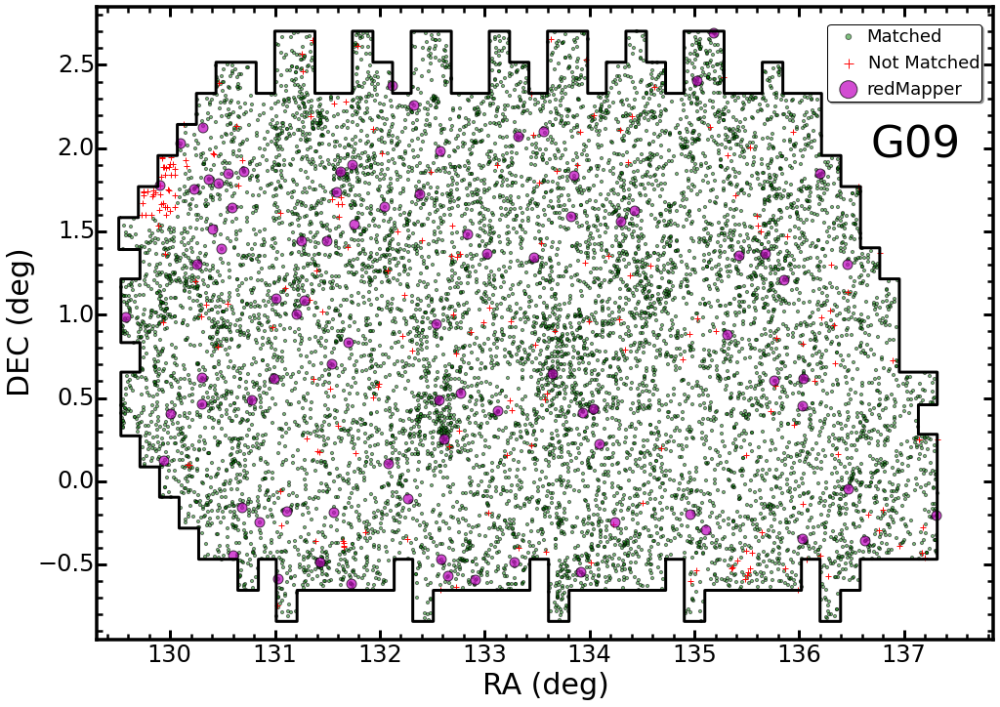

In [102]:
fig = plt.figure(figsize=(15, 12))
fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = fig.add_subplot(111)

# Matched ones 
ax1.scatter(g09Match['ra_hsc'], g09Match['dec_hsc'], c='g', s=10, 
            alpha=0.5, label='Matched')

# Not Matched ones 
ax1.scatter(g09NoMatch['ra_sdss'], g09NoMatch['dec_sdss'], c='r', 
            marker='+', s=30, alpha=0.95, label='Not Matched')

# RedMapper 
ax1.scatter(g09Red['RA'], g09Red['DEC'], c='m', s=100, 
            alpha=0.7, label='redMapper')

# Boundary 
g09_x, g09_y = g09Wkb.boundary.xy 
ax1.plot(g09_x, g09_y, c='k', lw=3.0)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('RA (deg)',  size=30)
ax1.set_ylabel('DEC (deg)', size=30)
# Axis limits
ax1.set_xlim(129.3, 137.85)
ax1.set_ylim(-0.95, 2.85)
# Title 
ax1.text(136.7, 1.95, 'G09', size=45)

# Legend
l_handles, l_labels = ax1.get_legend_handles_labels()
ax1.legend(l_handles, l_labels, loc=(0.815, 0.85),
           shadow=True, fancybox=True, 
           numpoints=1, fontsize=18, scatterpoints=1, 
           markerscale=1.8, borderpad=0.2, handletextpad=0.1)

fig.savefig('hsc_gama_g09_match.png', dpi=90)

# Distribution of Galaxies in W12

In [107]:
w12Wkb = polyReadWkb(w12_wkb, load=True)
w12Red = fits.open(w12_red)[1].data

w12Match = fits.open(w12_match)[1].data
w12NoMatch = fits.open(w12_not_match)[1].data 

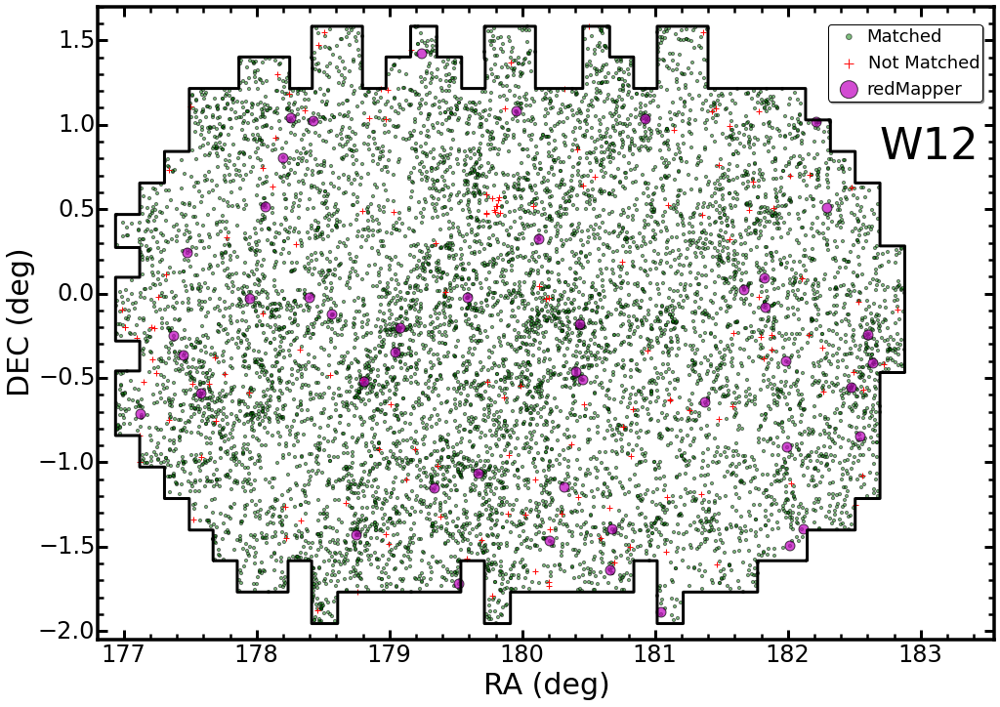

In [114]:
fig = plt.figure(figsize=(15, 12))
fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = fig.add_subplot(111)

# Matched ones 
ax1.scatter(w12Match['ra_hsc'], w12Match['dec_hsc'], c='g', s=10, 
            alpha=0.5, label='Matched')

# Not Matched ones 
ax1.scatter(w12NoMatch['ra_sdss'], w12NoMatch['dec_sdss'], c='r', 
            marker='+', s=30, alpha=0.95, label='Not Matched')

# RedMapper 
ax1.scatter(w12Red['RA'], w12Red['DEC'], c='m', s=100, 
            alpha=0.7, label='redMapper')

# Boundary 
w12_x, w12_y = w12Wkb.boundary.xy 
ax1.plot(w12_x, w12_y, c='k', lw=3.0)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('RA (deg)',  size=30)
ax1.set_ylabel('DEC (deg)', size=30)
# Axis limits
ax1.set_xlim(176.8, 183.55)
ax1.set_ylim(-2.05, 1.7)
# Title
ax1.text(182.7, 0.8, 'W12', size=45)

# Legend
l_handles, l_labels = ax1.get_legend_handles_labels()
ax1.legend(l_handles, l_labels, loc=(0.815, 0.85),
           shadow=True, fancybox=True, 
           numpoints=1, fontsize=18, scatterpoints=1, 
           markerscale=1.8, borderpad=0.2, handletextpad=0.1)

fig.savefig('hsc_gama_w12_match.png', dpi=90)

# Distributions of Galaxies in G15

In [126]:
g15Wkb = polyReadWkb(g15_wkb, load=True)
g15Red = fits.open(g15_red)[1].data

g15Match = fits.open(g15_match)[1].data
g15NoMatch = fits.open(g15_not_match)[1].data 

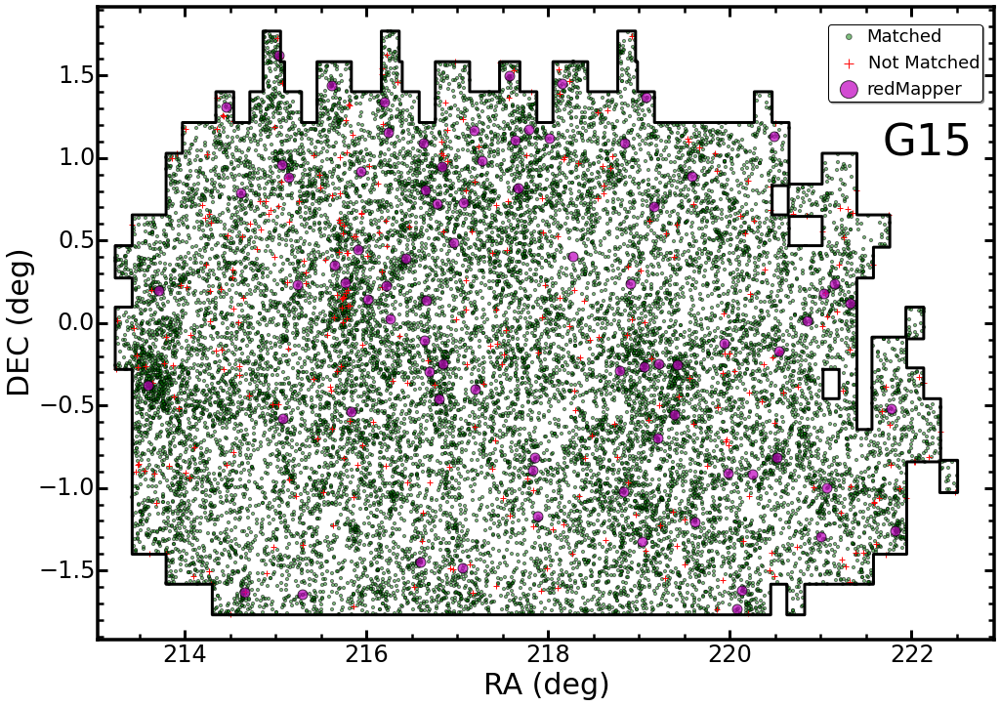

In [133]:
fig = plt.figure(figsize=(15, 12))
fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = fig.add_subplot(111)

# Matched ones 
ax1.scatter(g15Match['ra_hsc'], g15Match['dec_hsc'], c='g', s=10, 
            alpha=0.5, label='Matched')

# Not Matched ones 
ax1.scatter(g15NoMatch['ra_sdss'], g15NoMatch['dec_sdss'], c='r', 
            marker='+', s=30, alpha=0.95, label='Not Matched')

# RedMapper 
ax1.scatter(g15Red['RA'], g15Red['DEC'], c='m', s=100, 
            alpha=0.7, label='redMapper')

# Boundary 
for patch in g15Wkb.boundary: 
    g15_x, g15_y = patch.xy 
    ax1.plot(g15_x, g15_y, c='k', lw=3.0)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('RA (deg)',  size=30)
ax1.set_ylabel('DEC (deg)', size=30)
# Axis limits
minRa  = np.min(g15Match['ra_hsc']) - 0.2
maxRa  = np.max(g15Match['ra_hsc']) + 0.4
minDec = np.min(g15Match['dec_hsc']) - 0.15
maxDec = np.max(g15Match['dec_hsc']) + 0.15

ax1.set_xlim(minRa, maxRa)
ax1.set_ylim(minDec, maxDec)
# Title
ax1.text(maxRa-1.2, maxDec-0.9, 'G15', size=45)

# Legend
l_handles, l_labels = ax1.get_legend_handles_labels()
ax1.legend(l_handles, l_labels, loc=(0.815, 0.85),
           shadow=True, fancybox=True, 
           numpoints=1, fontsize=18, scatterpoints=1, 
           markerscale=1.8, borderpad=0.2, handletextpad=0.1)

fig.savefig('hsc_gama_g15_match.png', dpi=90)

# Photometric Comparison between SDSS and HSC

### Distributions of the not-matched galaxies on the Redshift v.s. modelMag 

In [12]:
gamaMatch = fits.open(gama_match)[1].data
gamaNoMatch = fits.open(gama_nomatch)[1].data

In [13]:
gamaPrimary = gamaMatch[gamaMatch['ir_detect_is_primary']]

In [14]:
gamaMatch = gamaPrimary

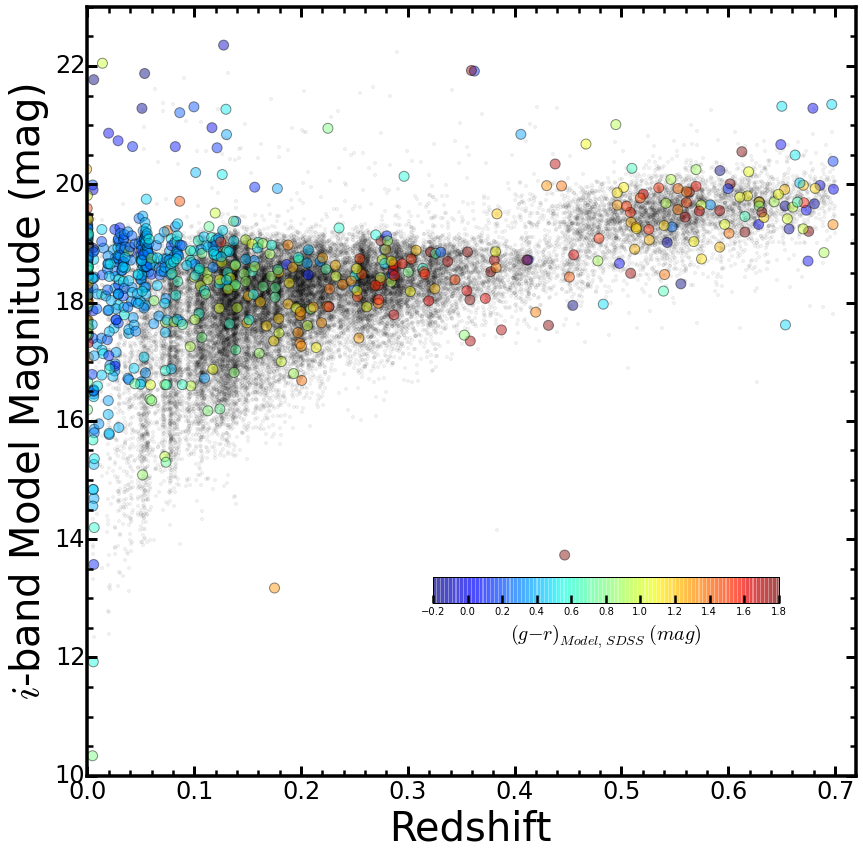

In [15]:
xuse = gamaNoMatch['z_use']
yuse = gamaNoMatch['modelMag_i']
cuse = gamaNoMatch['modelMag_g'] - gamaNoMatch['modelMag_r']
#suse = gamaNoMatch['ir_deblend_blendedness']

fig = plt.figure(figsize=(12, 12))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.10, 0.10, 0.89, 0.89]
ax1 = plt.axes(rec)
#ax2 = plt.axes(recHist)

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
ax1.scatter(gamaMatch['z_use'], gamaMatch['modelMag_i'], s=10.0, 
            alpha=0.05, c='k', label='Matched')
p = ax1.scatter(xuse, yuse, c=cuse, s=100.0, alpha=0.45, 
                label='Matched', vmin=-0.2, vmax=1.80)

# Color bar 
cax = fig.add_axes([0.50, 0.30, 0.4, 0.03]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('$(g-r)_{Model,\ SDSS}\ (mag)$', fontsize=20)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('Redshift',  size=40)
ax1.set_ylabel('$i$-band Model Magnitude (mag)', size=40)
# Axis limits
ax1.set_xlim(0.0, 0.72)
ax1.set_ylim(10.0, 23.0)

fig.savefig('hsc_gama_z_mag_notmatch.png', dpi=90)

In [20]:
xplot = gamaMatch['cmodelMag_i'] 
yplot = gamaMatch['imag_cmodel'] - gamaMatch['a_i']
xerr  = gamaMatch['cmodelMagErr_i']
yerr  = gamaMatch['imag_cmodel_err']
carr  = gamaMatch['modelMag_g'] - gamaMatch['modelMag_r']
sarr  = gamaMatch['ir_deblend_blendedness']

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:7: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:7: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:9: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:9: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:11: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:11: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: Runtime

(14.05, 22.2)

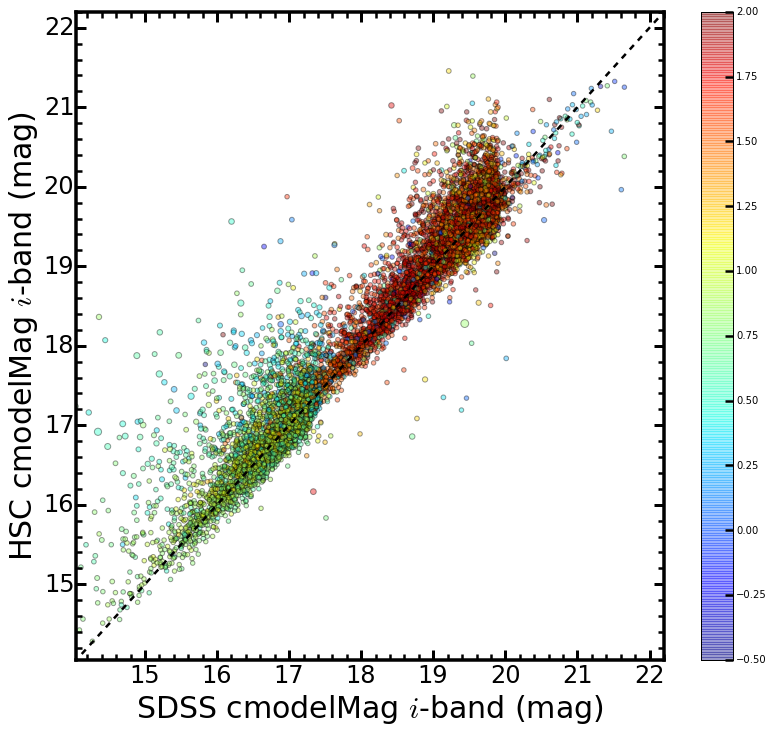

In [17]:
fig = plt.figure(figsize=(12, 12))
fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = fig.add_subplot(111)

# 
xuse = xplot[(xplot > 14.0) & (xplot < 22.0) & 
             (yplot > 14.0) & (yplot < 22.0)]
yuse = yplot[(xplot > 14.0) & (xplot < 22.0) & 
             (yplot > 14.0) & (yplot < 22.0)]
xuse = xplot[(xplot > 14.0) & (xplot < 22.0) & 
             (yplot > 14.0) & (yplot < 22.0)]
yuse = yplot[(xplot > 14.0) & (xplot < 22.0) & 
             (yplot > 14.0) & (yplot < 22.0)]
xuseErr = xerr[(xplot > 14.0) & (xplot < 22.0) & 
               (yplot > 14.0) & (yplot < 22.0)]
yuseErr = yerr[(xplot > 14.0) & (xplot < 22.0) & 
               (yplot > 14.0) & (yplot < 22.0)]
cuse = carr[(xplot > 14.0) & (xplot < 22.0) & 
            (yplot > 14.0) & (yplot < 22.0)]
suse = sarr[(xplot > 14.0) & (xplot < 22.0) & 
            (yplot > 14.0) & (yplot < 22.0)]

# One to one line 
ax1.plot(np.linspace(12, 23, 100), np.linspace(12, 23, 100), 
         linestyle='dashed', color='k', linewidth=2.5)

# Matched ones 
p = ax1.scatter(xuse, yuse, c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=-0.5, vmax=2.0)
fig.colorbar(p)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('SDSS cmodelMag $i$-band (mag)',  size=30)
ax1.set_ylabel('HSC cmodelMag $i$-band (mag)', size=30)
# Axis limits
ax1.set_xlim(14.05, 22.2)
ax1.set_ylim(14.05, 22.2)

# Magnitude difference 

## Relation with SDSS i-band cModel Magnitude 

In [21]:
# definitions for the axes
left, width    = 0.1, 0.71
right          = left + width 
bottom, height = 0.1, 0.88
bottom_h = left_h = left + width + 0.02
recScat = [left,   bottom, width, height]
recHist = [right,  bottom,  0.18, height]

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:23: Run

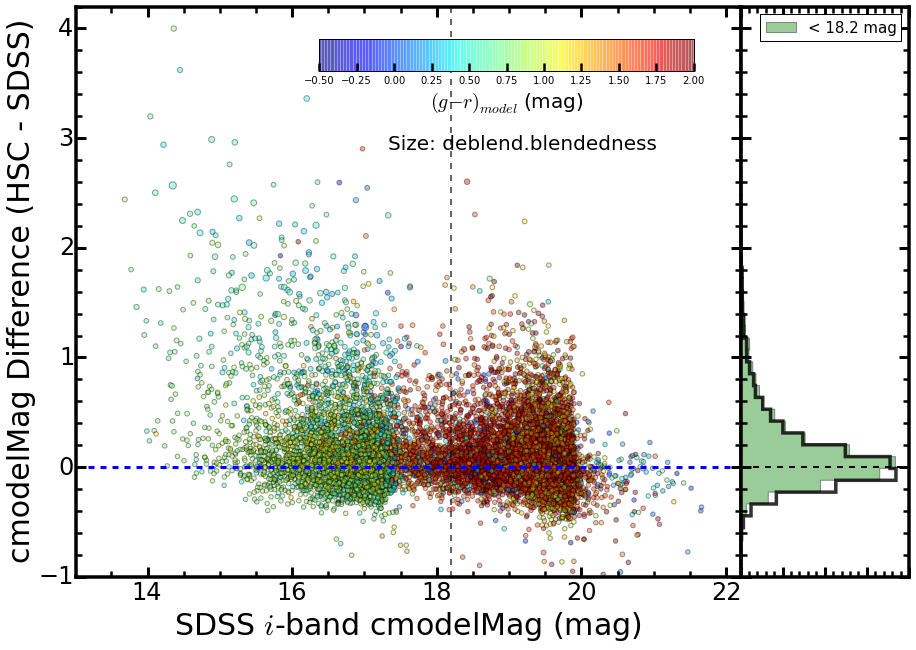

In [14]:
xplot = gamaMatch['cmodelMag_i'] 
yplot = gamaMatch['imag_cmodel'] - gamaMatch['a_i']
xerr  = gamaMatch['cmodelMagErr_i']
yerr  = gamaMatch['imag_cmodel_err']
carr  = gamaMatch['modelMag_g'] - gamaMatch['modelMag_r']
sarr  = gamaMatch['ir_deblend_blendedness']

fig = plt.figure(figsize=(13, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# 
xuse = xplot[(xplot > 10.0) & (xplot < 22.0) & 
             (yplot > 10.0) & (yplot < 22.0)]
yuse = yplot[(xplot > 10.0) & (xplot < 22.0) & 
             (yplot > 10.0) & (yplot < 22.0)]
xuse = xplot[(xplot > 10.0) & (xplot < 22.0) & 
             (yplot > 10.0) & (yplot < 22.0)]
yuse = yplot[(xplot > 10.0) & (xplot < 22.0) & 
             (yplot > 10.0) & (yplot < 22.0)]
xuseErr = xerr[(xplot > 10.0) & (xplot < 22.0) & 
               (yplot > 10.0) & (yplot < 22.0)]
yuseErr = yerr[(xplot > 10.0) & (xplot < 22.0) & 
               (yplot > 10.0) & (yplot < 22.0)]
cuse = carr[(xplot > 10.0) & (xplot < 22.0) & 
            (yplot > 10.0) & (yplot < 22.0)]
suse = sarr[(xplot > 10.0) & (xplot < 22.0) & 
            (yplot > 10.0) & (yplot < 22.0)]

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse, (yuse - xuse), c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=-0.5, vmax=2.0)

# Color bar 
cax = fig.add_axes([0.36, 0.88, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel(r'$(g-r)_{model}$ (mag)', fontsize=20)

ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(0.0, linestyle='dashed', linewidth=3.0)
# Vertical line
ax1.axvline(18.2, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('SDSS $i$-band cmodelMag (mag)',  size=30)
ax1.set_ylabel('cmodelMag Difference (HSC - SDSS)', size=30)
# Axis limits
ax1.set_xlim(13.01, 22.2)
ax1.set_ylim(-1.0, 4.2)

# ---------------------------------------------------------------------------
# Histogram 
xbright = xuse[xuse < 18.2]
ybright = yuse[xuse < 18.2]
n, bins, patches=ax2.hist((ybright-xbright), bins=50, range=[-1.2, 4.2], 
                             orientation='horizontal', histtype='stepfilled', 
                             color='g', alpha=0.4, normed=1, label='< 18.2 mag')
n, bins, patches=ax2.hist((yuse-xuse), bins=50, range=[-1.2, 4.2], 
                             orientation='horizontal', histtype='step', 
                             color='k', alpha=0.8, normed=1, linewidth=3.5)

ax2.set_ylim(ax1.get_ylim())

ax2.legend(fontsize=15)

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

#ax2.axhline(medMagDiff1a, color='b', linestyle='-', linewidth=3, alpha=0.4)
ax2.axhline(0.0, color='k', linewidth=2, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('hsc_gama_cmodelmag_i_1.png', dpi=90)

## Relationship with redshift

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:16: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:16: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:18: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:18: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:20: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:20: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:22: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:22: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:24: Run

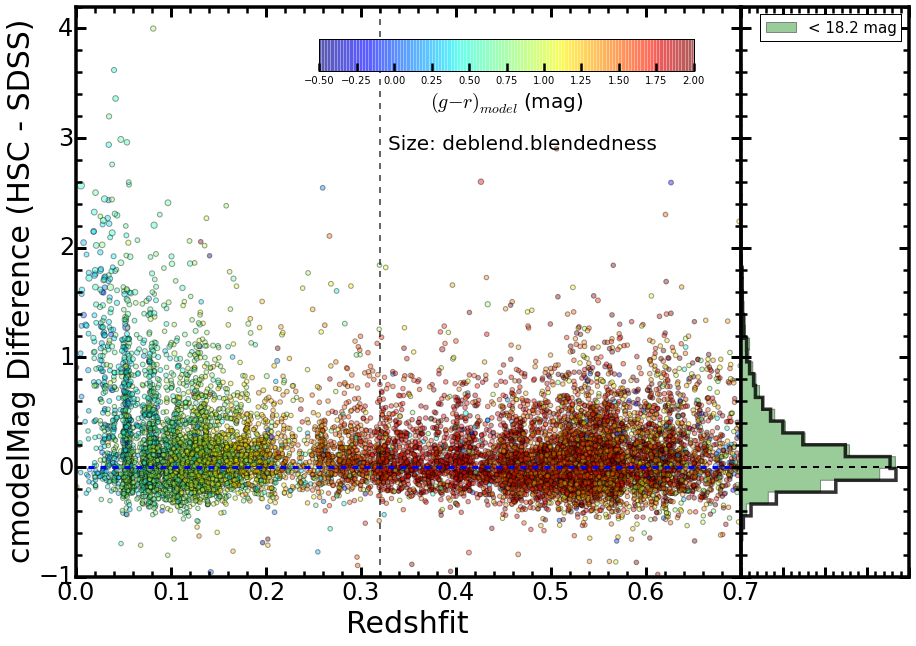

In [15]:
xplot = gamaMatch['cmodelMag_i'] 
yplot = gamaMatch['imag_cmodel'] - gamaMatch['a_i']
xerr  = gamaMatch['cmodelMagErr_i']
yerr  = gamaMatch['imag_cmodel_err']
carr  = gamaMatch['modelMag_g'] - gamaMatch['modelMag_r']
sarr  = gamaMatch['ir_deblend_blendedness']
redshift = gamaMatch['z_use']

fig = plt.figure(figsize=(13, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# 
xuse = xplot[(xplot > 10.0) & (xplot < 22.0) & 
             (yplot > 10.0) & (yplot < 22.0)]
yuse = yplot[(xplot > 10.0) & (xplot < 22.0) & 
             (yplot > 10.0) & (yplot < 22.0)]
xuse = xplot[(xplot > 10.0) & (xplot < 22.0) & 
             (yplot > 10.0) & (yplot < 22.0)]
yuse = yplot[(xplot > 10.0) & (xplot < 22.0) & 
             (yplot > 10.0) & (yplot < 22.0)]
xuseErr = xerr[(xplot > 10.0) & (xplot < 22.0) & 
               (yplot > 10.0) & (yplot < 22.0)]
yuseErr = yerr[(xplot > 10.0) & (xplot < 22.0) & 
               (yplot > 10.0) & (yplot < 22.0)]
cuse = carr[(xplot > 10.0) & (xplot < 22.0) & 
            (yplot > 10.0) & (yplot < 22.0)]
suse = sarr[(xplot > 10.0) & (xplot < 22.0) & 
            (yplot > 10.0) & (yplot < 22.0)]
zuse = redshift[(xplot > 10.0) & (xplot < 22.0) & 
                (yplot > 10.0) & (yplot < 22.0)]

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(zuse, (yuse - xuse), c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=-0.5, vmax=2.0)

# Color bar 
cax = fig.add_axes([0.36, 0.88, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel(r'$(g-r)_{model}$ (mag)', fontsize=20)

ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(0.0, linestyle='dashed', linewidth=3.0)
# Vertical line
ax1.axvline(0.32, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('Redshfit',  size=30)
ax1.set_ylabel('cmodelMag Difference (HSC - SDSS)', size=30)
# Axis limits
ax1.set_xlim(0.00, 0.70)
ax1.set_ylim(-1.0, 4.2)

# ---------------------------------------------------------------------------
# Histogram 
xbright = xuse[xuse < 18.2]
ybright = yuse[xuse < 18.2]
n, bins, patches=ax2.hist((ybright-xbright), bins=50, range=[-1.2, 4.2], 
                             orientation='horizontal', histtype='stepfilled', 
                             color='g', alpha=0.4, normed=1, label='< 18.2 mag')
n, bins, patches=ax2.hist((yuse-xuse), bins=50, range=[-1.2, 4.2], 
                             orientation='horizontal', histtype='step', 
                             color='k', alpha=0.8, normed=1, linewidth=3.5)

ax2.set_ylim(ax1.get_ylim())

ax2.legend(fontsize=15)

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

#ax2.axhline(medMagDiff1a, color='b', linestyle='-', linewidth=3, alpha=0.4)
ax2.axhline(0.0, color='k', linewidth=2, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('hsc_gama_cmodelmag_i_2.png', dpi=90)

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:14: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:14: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:16: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:16: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:18: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:18: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:20: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:20: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:22: Run

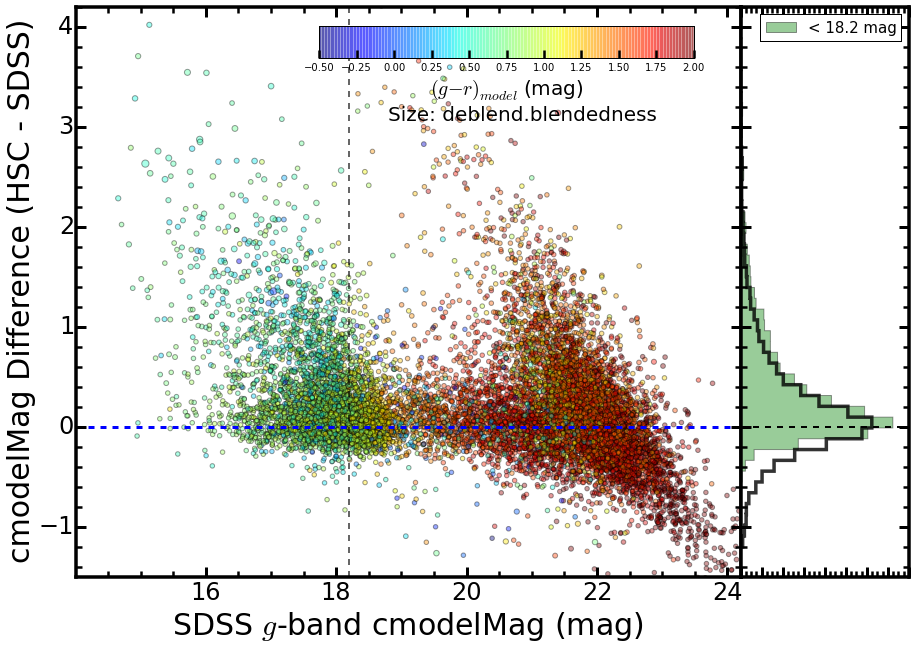

In [231]:
xplot = gamaMatch['cmodelMag_g'] 
yplot = gamaMatch['gmag_cmodel'] - gamaMatch['a_g']
xerr  = gamaMatch['cmodelMagErr_g']
yerr  = gamaMatch['gmag_cmodel_err']
carr  = gamaMatch['modelMag_g'] - gamaMatch['modelMag_r']
sarr  = gamaMatch['ir_deblend_blendedness']

fig = plt.figure(figsize=(13, 9))
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# 
xuse = xplot[(xplot > 10.0) & (xplot < 25.0) & 
             (yplot > 10.0) & (yplot < 25.0)]
yuse = yplot[(xplot > 10.0) & (xplot < 25.0) & 
             (yplot > 10.0) & (yplot < 25.0)]
xuse = xplot[(xplot > 10.0) & (xplot < 25.0) & 
             (yplot > 10.0) & (yplot < 25.0)]
yuse = yplot[(xplot > 10.0) & (xplot < 25.0) & 
             (yplot > 10.0) & (yplot < 25.0)]
xuseErr = xerr[(xplot > 10.0) & (xplot < 25.0) & 
               (yplot > 10.0) & (yplot < 25.0)]
yuseErr = yerr[(xplot > 10.0) & (xplot < 25.0) & 
               (yplot > 10.0) & (yplot < 25.0)]
cuse = carr[(xplot > 10.0) & (xplot < 25.0) & 
            (yplot > 10.0) & (yplot < 25.0)]
suse = sarr[(xplot > 10.0) & (xplot < 25.0) & 
            (yplot > 10.0) & (yplot < 25.0)]

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse, (yuse - xuse), c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=-0.5, vmax=2.0)

# Color bar 
cax = fig.add_axes([0.36, 0.90, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel(r'$(g-r)_{model}$ (mag)', fontsize=20)

ax1.text(0.47, 0.80, 'Size: deblend.blendedness', fontsize=20, 
         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(0.0, linestyle='dashed', linewidth=3.0)
# Vertical line
ax1.axvline(18.2, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('SDSS $g$-band cmodelMag (mag)',  size=30)
ax1.set_ylabel('cmodelMag Difference (HSC - SDSS)', size=30)
# Axis limits
ax1.set_xlim(14.01, 24.2)
ax1.set_ylim(-1.5, 4.2)

# ---------------------------------------------------------------------------
# Histogram 
xbright = xuse[xuse < 18.2]
ybright = yuse[xuse < 18.2]
n, bins, patches=ax2.hist((ybright-xbright), bins=50, range=[-1.2, 4.2], 
                             orientation='horizontal', histtype='stepfilled', 
                             color='g', alpha=0.4, normed=1, label='< 18.2 mag')
n, bins, patches=ax2.hist((yuse-xuse), bins=50, range=[-1.2, 4.2], 
                             orientation='horizontal', histtype='step', 
                             color='k', alpha=0.8, normed=1, linewidth=3.5)

ax2.set_ylim(ax1.get_ylim())

ax2.legend(fontsize=15)

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

#ax2.axhline(medMagDiff1a, color='b', linestyle='-', linewidth=3, alpha=0.4)
ax2.axhline(0.0, color='k', linewidth=2, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('hsc_gama_cmodelmag_g_1.png', dpi=90)

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:23: Run

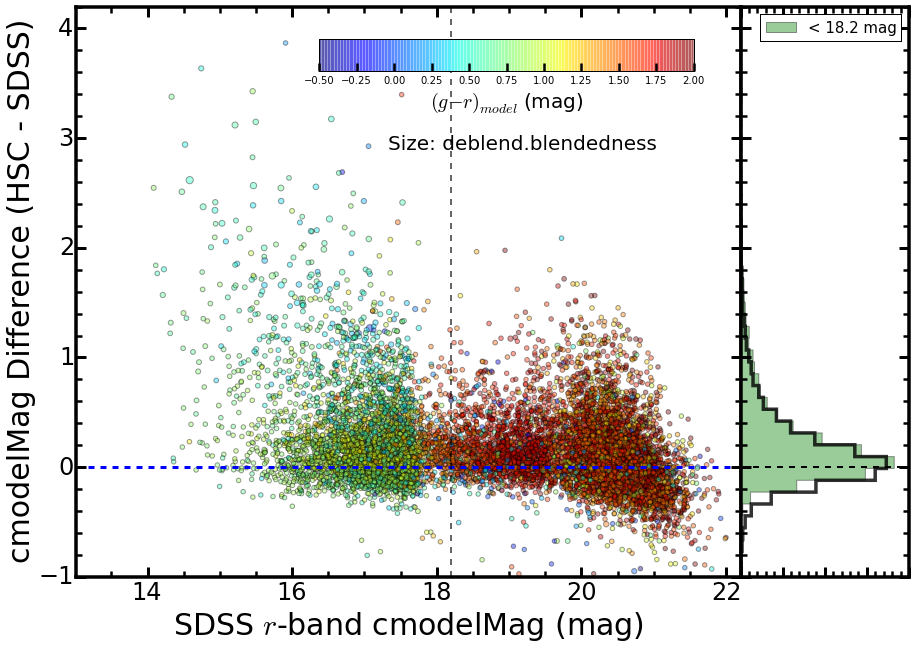

In [233]:
xplot = gamaMatch['cmodelMag_r'] 
yplot = gamaMatch['rmag_cmodel'] - gamaMatch['a_r']
xerr  = gamaMatch['cmodelMagErr_r']
yerr  = gamaMatch['rmag_cmodel_err']
carr  = gamaMatch['modelMag_g'] - gamaMatch['modelMag_r']
sarr  = gamaMatch['ir_deblend_blendedness']

fig = plt.figure(figsize=(13, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# 
xuse = xplot[(xplot > 10.0) & (xplot < 22.0) & 
             (yplot > 10.0) & (yplot < 22.0)]
yuse = yplot[(xplot > 10.0) & (xplot < 22.0) & 
             (yplot > 10.0) & (yplot < 22.0)]
xuse = xplot[(xplot > 10.0) & (xplot < 22.0) & 
             (yplot > 10.0) & (yplot < 22.0)]
yuse = yplot[(xplot > 10.0) & (xplot < 22.0) & 
             (yplot > 10.0) & (yplot < 22.0)]
xuseErr = xerr[(xplot > 10.0) & (xplot < 22.0) & 
               (yplot > 10.0) & (yplot < 22.0)]
yuseErr = yerr[(xplot > 10.0) & (xplot < 22.0) & 
               (yplot > 10.0) & (yplot < 22.0)]
cuse = carr[(xplot > 10.0) & (xplot < 22.0) & 
            (yplot > 10.0) & (yplot < 22.0)]
suse = sarr[(xplot > 10.0) & (xplot < 22.0) & 
            (yplot > 10.0) & (yplot < 22.0)]

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse, (yuse - xuse), c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=-0.5, vmax=2.0)

# Color bar 
cax = fig.add_axes([0.36, 0.88, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel(r'$(g-r)_{model}$ (mag)', fontsize=20)

ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(0.0, linestyle='dashed', linewidth=3.0)
# Vertical line
ax1.axvline(18.2, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('SDSS $r$-band cmodelMag (mag)',  size=30)
ax1.set_ylabel('cmodelMag Difference (HSC - SDSS)', size=30)
# Axis limits
ax1.set_xlim(13.01, 22.2)
ax1.set_ylim(-1.0, 4.2)

# ---------------------------------------------------------------------------
# Histogram 
xbright = xuse[xuse < 18.2]
ybright = yuse[xuse < 18.2]
n, bins, patches=ax2.hist((ybright-xbright), bins=50, range=[-1.2, 4.2], 
                             orientation='horizontal', histtype='stepfilled', 
                             color='g', alpha=0.4, normed=1, label='< 18.2 mag')
n, bins, patches=ax2.hist((yuse-xuse), bins=50, range=[-1.2, 4.2], 
                             orientation='horizontal', histtype='step', 
                             color='k', alpha=0.8, normed=1, linewidth=3.5)

ax2.set_ylim(ax1.get_ylim())

ax2.legend(fontsize=15)

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

#ax2.axhline(medMagDiff1a, color='b', linestyle='-', linewidth=3, alpha=0.4)
ax2.axhline(0.0, color='k', linewidth=2, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('hsc_gama_cmodelmag_r_1.png', dpi=90)

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:21: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:23: Run

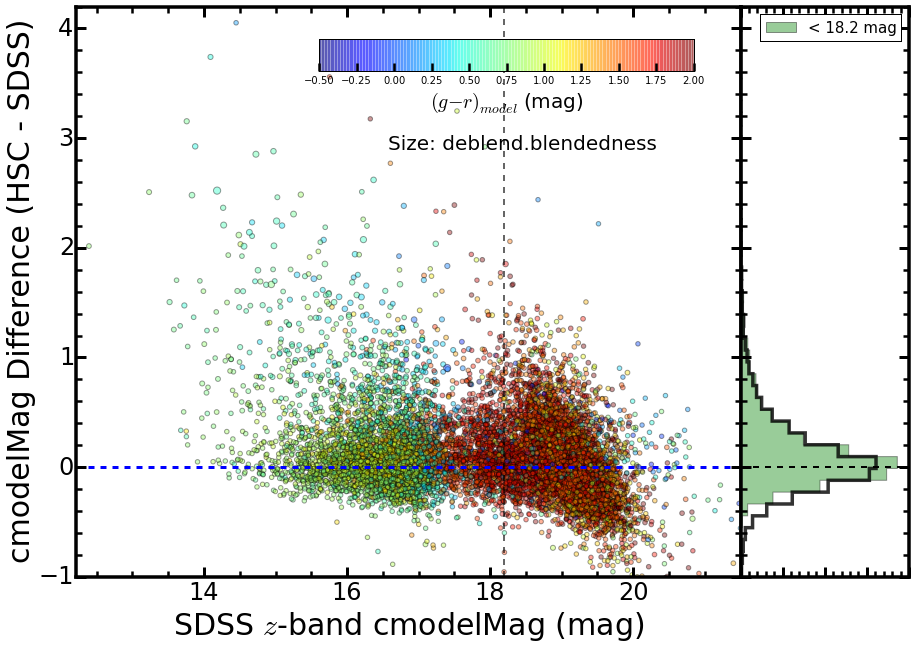

In [237]:
xplot = gamaMatch['cmodelMag_z'] 
yplot = gamaMatch['zmag_cmodel'] - gamaMatch['a_z']
xerr  = gamaMatch['cmodelMagErr_z']
yerr  = gamaMatch['zmag_cmodel_err']
carr  = gamaMatch['modelMag_g'] - gamaMatch['modelMag_r']
sarr  = gamaMatch['ir_deblend_blendedness']

fig = plt.figure(figsize=(13, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# 
xuse = xplot[(xplot > 10.0) & (xplot < 22.0) & 
             (yplot > 10.0) & (yplot < 22.0)]
yuse = yplot[(xplot > 10.0) & (xplot < 22.0) & 
             (yplot > 10.0) & (yplot < 22.0)]
xuse = xplot[(xplot > 10.0) & (xplot < 22.0) & 
             (yplot > 10.0) & (yplot < 22.0)]
yuse = yplot[(xplot > 10.0) & (xplot < 22.0) & 
             (yplot > 10.0) & (yplot < 22.0)]
xuseErr = xerr[(xplot > 10.0) & (xplot < 22.0) & 
               (yplot > 10.0) & (yplot < 22.0)]
yuseErr = yerr[(xplot > 10.0) & (xplot < 22.0) & 
               (yplot > 10.0) & (yplot < 22.0)]
cuse = carr[(xplot > 10.0) & (xplot < 22.0) & 
            (yplot > 10.0) & (yplot < 22.0)]
suse = sarr[(xplot > 10.0) & (xplot < 22.0) & 
            (yplot > 10.0) & (yplot < 22.0)]

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse, (yuse - xuse), c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=-0.5, vmax=2.0)

# Color bar 
cax = fig.add_axes([0.36, 0.88, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel(r'$(g-r)_{model}$ (mag)', fontsize=20)

ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(0.0, linestyle='dashed', linewidth=3.0)
# Vertical line
ax1.axvline(18.2, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('SDSS $z$-band cmodelMag (mag)',  size=30)
ax1.set_ylabel('cmodelMag Difference (HSC - SDSS)', size=30)
# Axis limits
ax1.set_xlim(12.21, 21.5)
ax1.set_ylim(-1.0, 4.2)

# ---------------------------------------------------------------------------
# Histogram 
xbright = xuse[xuse < 18.2]
ybright = yuse[xuse < 18.2]
n, bins, patches=ax2.hist((ybright-xbright), bins=50, range=[-1.2, 4.2], 
                             orientation='horizontal', histtype='stepfilled', 
                             color='g', alpha=0.4, normed=1, label='< 18.2 mag')
n, bins, patches=ax2.hist((yuse-xuse), bins=50, range=[-1.2, 4.2], 
                             orientation='horizontal', histtype='step', 
                             color='k', alpha=0.8, normed=1, linewidth=3.5)

ax2.set_ylim(ax1.get_ylim())

ax2.legend(fontsize=15)

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

#ax2.axhline(medMagDiff1a, color='b', linestyle='-', linewidth=3, alpha=0.4)
ax2.axhline(0.0, color='k', linewidth=2, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('hsc_gama_cmodelmag_z_1.png', dpi=90)

# Color Comparison 

## (g-r) Color using cModel Magnitude 

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:21: Run

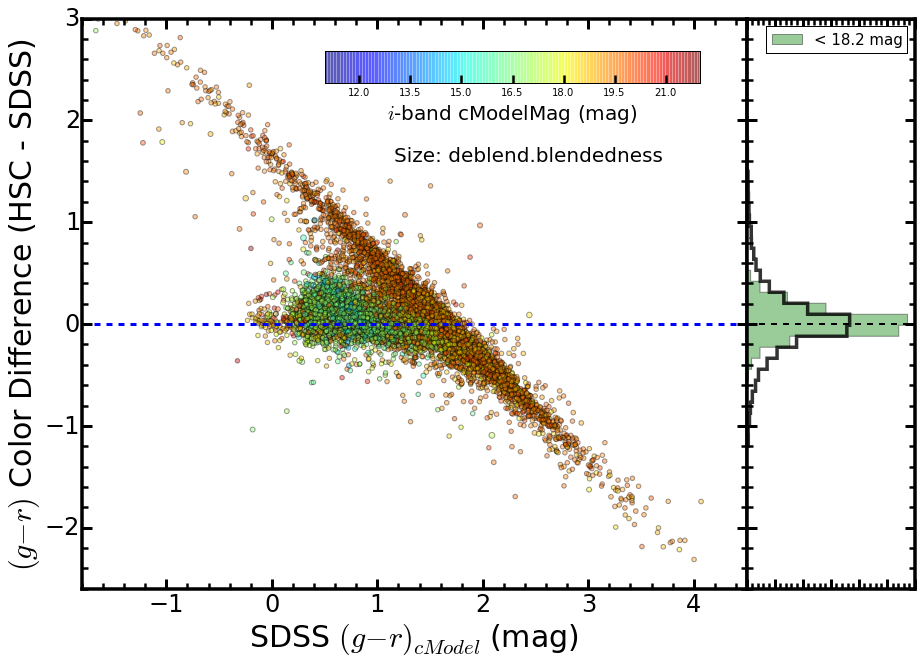

In [251]:
xplot = gamaMatch['cmodelMag_g'] - gamaMatch['cmodelMag_r'] 
yplot = gamaMatch['gmag_cmodel'] - gamaMatch['a_g'] - \
        gamaMatch['rmag_cmodel'] + gamaMatch['a_r']
carr  = gamaMatch['cmodelMag_i']
sarr  = gamaMatch['ir_deblend_blendedness']

fig = plt.figure(figsize=(13, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# 
xuse = xplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
yuse = yplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
xuseErr = xerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
yuseErr = yerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
cuse = carr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]
suse = sarr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse, (yuse - xuse), c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=11.0, vmax=22.0)

# Color bar 
cax = fig.add_axes([0.36, 0.88, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('$i$-band cModelMag (mag)', fontsize=20)

ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(0.0, linestyle='dashed', linewidth=3.0)
# Vertical line
ax1.axvline(18.2, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('SDSS $(g-r)_{cModel}$ (mag)',  size=30)
ax1.set_ylabel('$(g-r)$ Color Difference (HSC - SDSS)', size=30)
# Axis limits
ax1.set_xlim(-1.8, 4.5)
ax1.set_ylim(-2.6, 3.0)

# ---------------------------------------------------------------------------
# Histogram 
xbright = xuse[cuse < 18.2]
ybright = yuse[cuse < 18.2]
n, bins, patches=ax2.hist((ybright-xbright), bins=50, range=[-1.2, 4.2], 
                             orientation='horizontal', histtype='stepfilled', 
                             color='g', alpha=0.4, normed=1, label='< 18.2 mag')
n, bins, patches=ax2.hist((yuse-xuse), bins=50, range=[-1.2, 4.2], 
                             orientation='horizontal', histtype='step', 
                             color='k', alpha=0.8, normed=1, linewidth=3.5)

ax2.set_ylim(ax1.get_ylim())

ax2.legend(fontsize=15)

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

#ax2.axhline(medMagDiff1a, color='b', linestyle='-', linewidth=3, alpha=0.4)
ax2.axhline(0.0, color='k', linewidth=2, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('hsc_gama_cmodel_gr_1.png', dpi=90)

## Colors using modelMag

### Using Exp model, relation with SDSS model color 

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:21: Run

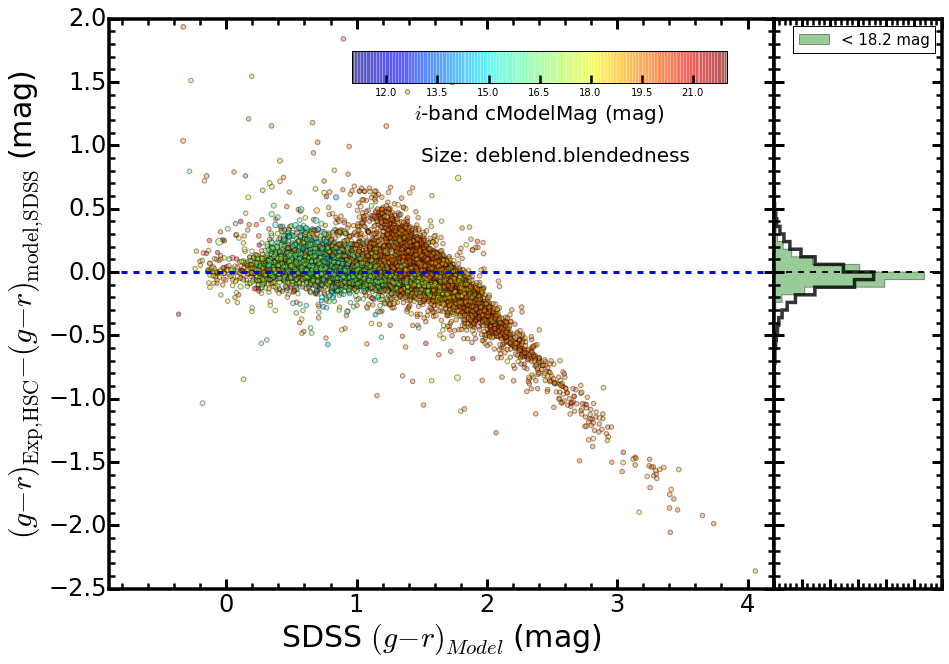

In [264]:
xplot = gamaMatch['modelMag_g'] - gamaMatch['modelMag_r'] 
yplot = gamaMatch['gmag_cmodel_exp'] - gamaMatch['a_g'] - \
        gamaMatch['rmag_cmodel_exp'] + gamaMatch['a_r']
carr  = gamaMatch['cmodelMag_i']
sarr  = gamaMatch['ir_deblend_blendedness']

fig = plt.figure(figsize=(13, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# 
xuse = xplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
yuse = yplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
xuseErr = xerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
yuseErr = yerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
cuse = carr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]
suse = sarr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse, (yuse - xuse), c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=11.0, vmax=22.0)

# Color bar 
cax = fig.add_axes([0.36, 0.88, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('$i$-band cModelMag (mag)', fontsize=20)

ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(0.0, linestyle='dashed', linewidth=3.0)
# Vertical line
ax1.axvline(18.2, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('SDSS $(g-r)_{Model}$ (mag)',  size=30)
ax1.set_ylabel('$(g-r)_{\mathrm{Exp, HSC}}-(g-r)_{\mathrm{model, SDSS}}$ (mag)', size=30)
# Axis limits
ax1.set_xlim(-0.9, 4.2)
ax1.set_ylim(-2.5, 2.0)

# ---------------------------------------------------------------------------
# Histogram 
xbright = xuse[cuse < 18.2]
ybright = yuse[cuse < 18.2]
n, bins, patches=ax2.hist((ybright-xbright), bins=90, range=[-1.2, 4.2], 
                             orientation='horizontal', histtype='stepfilled', 
                             color='g', alpha=0.4, normed=1, label='< 18.2 mag')
n, bins, patches=ax2.hist((yuse-xuse), bins=90, range=[-1.2, 4.2], 
                             orientation='horizontal', histtype='step', 
                             color='k', alpha=0.8, normed=1, linewidth=3.5)

ax2.set_ylim(ax1.get_ylim())

ax2.legend(fontsize=15)

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

#ax2.axhline(medMagDiff1a, color='b', linestyle='-', linewidth=3, alpha=0.4)
ax2.axhline(0.0, color='k', linewidth=2, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('hsc_gama_model_gr_1.png', dpi=90)

### Relation with Redshift

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:14: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:14: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:16: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:16: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:18: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:18: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:20: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:20: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:22: Run

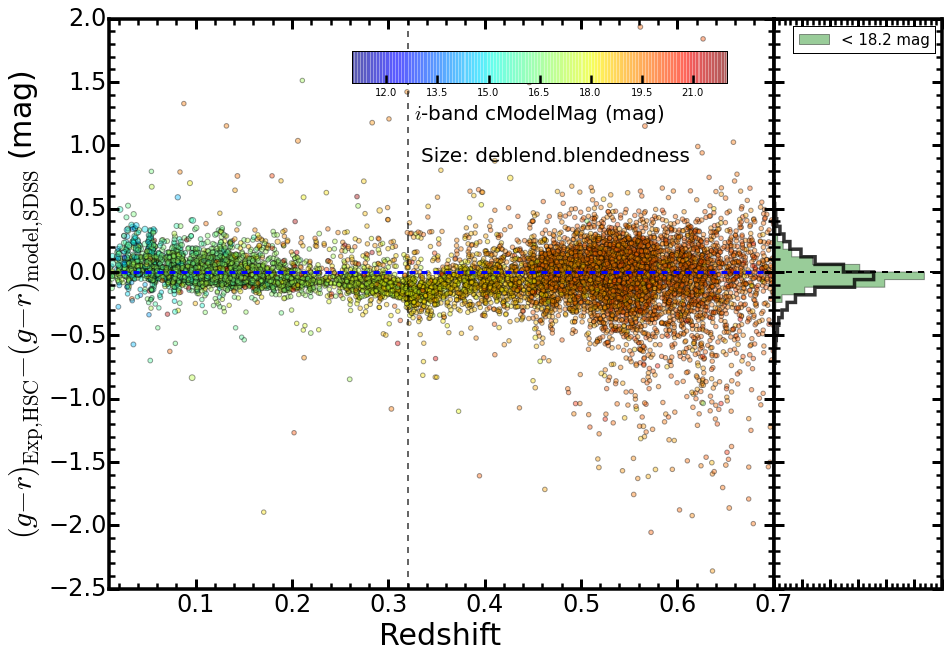

In [42]:
xplot = gamaMatch['modelMag_g'] - gamaMatch['modelMag_r'] 
yplot = gamaMatch['gmag_cmodel_exp'] - gamaMatch['a_g'] - \
        gamaMatch['rmag_cmodel_exp'] + gamaMatch['a_r']
carr  = gamaMatch['cmodelMag_i']
sarr  = gamaMatch['ir_deblend_blendedness']
redshift = gamaMatch['z_use']

fig = plt.figure(figsize=(13, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# 
xuse = xplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
yuse = yplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
xuseErr = xerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
yuseErr = yerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
cuse = carr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]
suse = sarr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]
zuse = redshift[(carr > 10.0) & (carr < 22.0) & 
                (carr > 10.0) & (carr < 22.0)]

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(zuse, (yuse - xuse), c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=11.0, vmax=22.0)

# Color bar 
cax = fig.add_axes([0.36, 0.88, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('$i$-band cModelMag (mag)', fontsize=20)

ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(0.0, linestyle='dashed', linewidth=3.0)
# Vertical line
ax1.axvline(0.32, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('Redshift',  size=30)
ax1.set_ylabel('$(g-r)_{\mathrm{Exp, HSC}}-(g-r)_{\mathrm{model, SDSS}}$ (mag)', size=30)
# Axis limits
ax1.set_xlim(0.01, 0.70)
ax1.set_ylim(-2.5, 2.0)

# ---------------------------------------------------------------------------
# Histogram 
xbright = xuse[cuse < 18.2]
ybright = yuse[cuse < 18.2]
n, bins, patches=ax2.hist((ybright-xbright), bins=90, range=[-1.2, 4.2], 
                             orientation='horizontal', histtype='stepfilled', 
                             color='g', alpha=0.4, normed=1, label='< 18.2 mag')
n, bins, patches=ax2.hist((yuse-xuse), bins=90, range=[-1.2, 4.2], 
                             orientation='horizontal', histtype='step', 
                             color='k', alpha=0.8, normed=1, linewidth=3.5)

ax2.set_ylim(ax1.get_ylim())

ax2.legend(fontsize=15)

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

#ax2.axhline(medMagDiff1a, color='b', linestyle='-', linewidth=3, alpha=0.4)
ax2.axhline(0.0, color='k', linewidth=2, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('hsc_gama_model_gr_3.png', dpi=90)

### Using DeV models; Relation with SDSS model color

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:21: Run

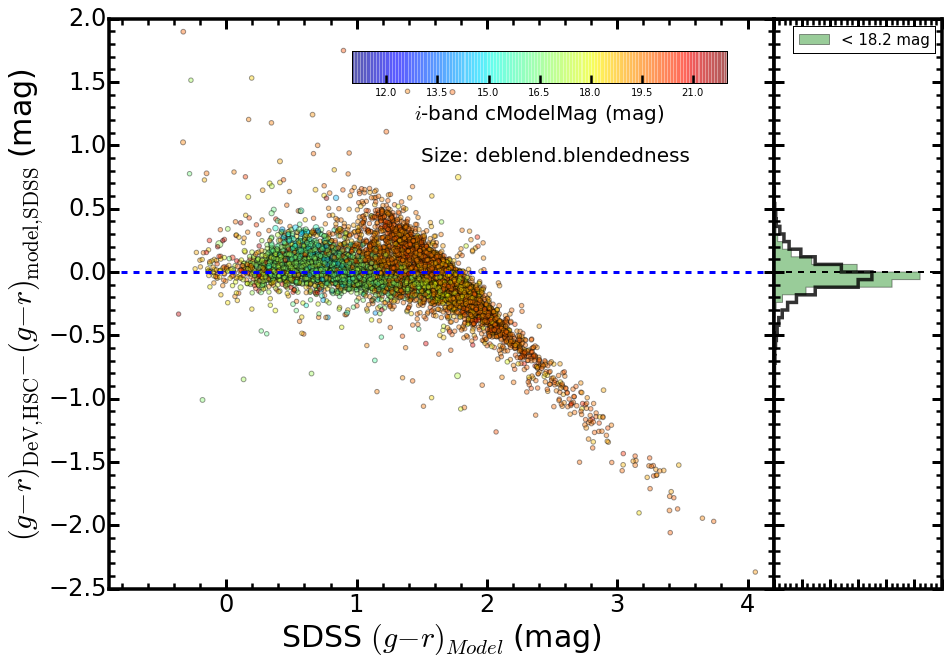

In [41]:
xplot = gamaMatch['modelMag_g'] - gamaMatch['modelMag_r'] 
yplot = gamaMatch['gmag_cmodel_dev'] - gamaMatch['a_g'] - \
        gamaMatch['rmag_cmodel_dev'] + gamaMatch['a_r']
carr  = gamaMatch['cmodelMag_i']
sarr  = gamaMatch['ir_deblend_blendedness']

fig = plt.figure(figsize=(13, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# 
xuse = xplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
yuse = yplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
xuseErr = xerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
yuseErr = yerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
cuse = carr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]
suse = sarr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse, (yuse - xuse), c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=11.0, vmax=22.0)

# Color bar 
cax = fig.add_axes([0.36, 0.88, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('$i$-band cModelMag (mag)', fontsize=20)

ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(0.0, linestyle='dashed', linewidth=3.0)
# Vertical line
ax1.axvline(18.2, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('SDSS $(g-r)_{Model}$ (mag)',  size=30)
ax1.set_ylabel('$(g-r)_{\mathrm{DeV, HSC}}-(g-r)_{\mathrm{model, SDSS}}$ (mag)', size=30)
# Axis limits
ax1.set_xlim(-0.9, 4.2)
ax1.set_ylim(-2.5, 2.0)

# ---------------------------------------------------------------------------
# Histogram 
xbright = xuse[cuse < 18.2]
ybright = yuse[cuse < 18.2]
n, bins, patches=ax2.hist((ybright-xbright), bins=90, range=[-1.2, 4.2], 
                             orientation='horizontal', histtype='stepfilled', 
                             color='g', alpha=0.4, normed=1, label='< 18.2 mag')
n, bins, patches=ax2.hist((yuse-xuse), bins=90, range=[-1.2, 4.2], 
                             orientation='horizontal', histtype='step', 
                             color='k', alpha=0.8, normed=1, linewidth=3.5)

ax2.set_ylim(ax1.get_ylim())

ax2.legend(fontsize=15)

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

#ax2.axhline(medMagDiff1a, color='b', linestyle='-', linewidth=3, alpha=0.4)
ax2.axhline(0.0, color='k', linewidth=2, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('hsc_gama_model_gr_2.png', dpi=90)

## (r-i) Color using Exp Models 

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:21: Run

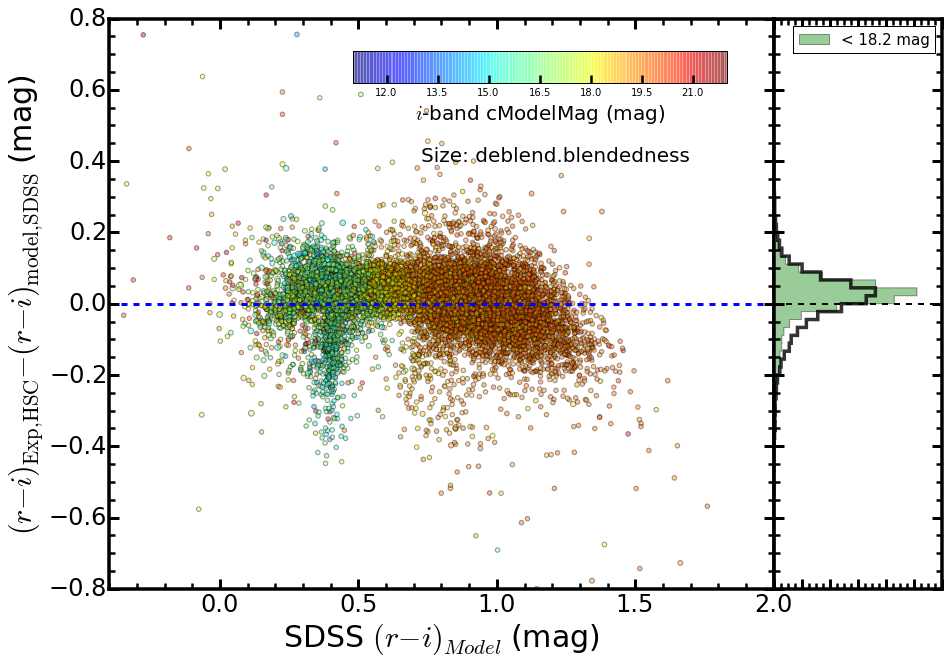

In [269]:
xplot = gamaMatch['modelMag_r'] - gamaMatch['modelMag_i'] 
yplot = gamaMatch['rmag_cmodel_exp'] - gamaMatch['a_r'] - \
        gamaMatch['imag_cmodel_exp'] + gamaMatch['a_i']
carr  = gamaMatch['cmodelMag_i']
sarr  = gamaMatch['ir_deblend_blendedness']

fig = plt.figure(figsize=(13, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# 
xuse = xplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
yuse = yplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
xuseErr = xerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
yuseErr = yerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
cuse = carr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]
suse = sarr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse, (yuse - xuse), c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=11.0, vmax=22.0)

# Color bar 
cax = fig.add_axes([0.36, 0.88, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('$i$-band cModelMag (mag)', fontsize=20)

ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(0.0, linestyle='dashed', linewidth=3.0)
# Vertical line
ax1.axvline(18.2, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('SDSS $(r-i)_{Model}$ (mag)',  size=30)
ax1.set_ylabel('$(r-i)_{\mathrm{Exp, HSC}}-(r-i)_{\mathrm{model, SDSS}}$ (mag)', size=30)
# Axis limits
ax1.set_xlim(-0.4, 2.0)
ax1.set_ylim(-0.8, 0.8)

# ---------------------------------------------------------------------------
# Histogram 
xbright = xuse[cuse < 18.2]
ybright = yuse[cuse < 18.2]
n, bins, patches=ax2.hist((ybright-xbright), bins=90, range=[-1.0, 1.0], 
                             orientation='horizontal', histtype='stepfilled', 
                             color='g', alpha=0.4, normed=1, label='< 18.2 mag')
n, bins, patches=ax2.hist((yuse-xuse), bins=90, range=[-1.0, 1.0], 
                             orientation='horizontal', histtype='step', 
                             color='k', alpha=0.8, normed=1, linewidth=3.5)

ax2.set_ylim(ax1.get_ylim())

ax2.legend(fontsize=15)

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

#ax2.axhline(medMagDiff1a, color='b', linestyle='-', linewidth=3, alpha=0.4)
ax2.axhline(0.0, color='k', linewidth=2, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('hsc_gama_model_ri_1.png', dpi=90)

## (g-i) Color using Exp Models

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:21: Run

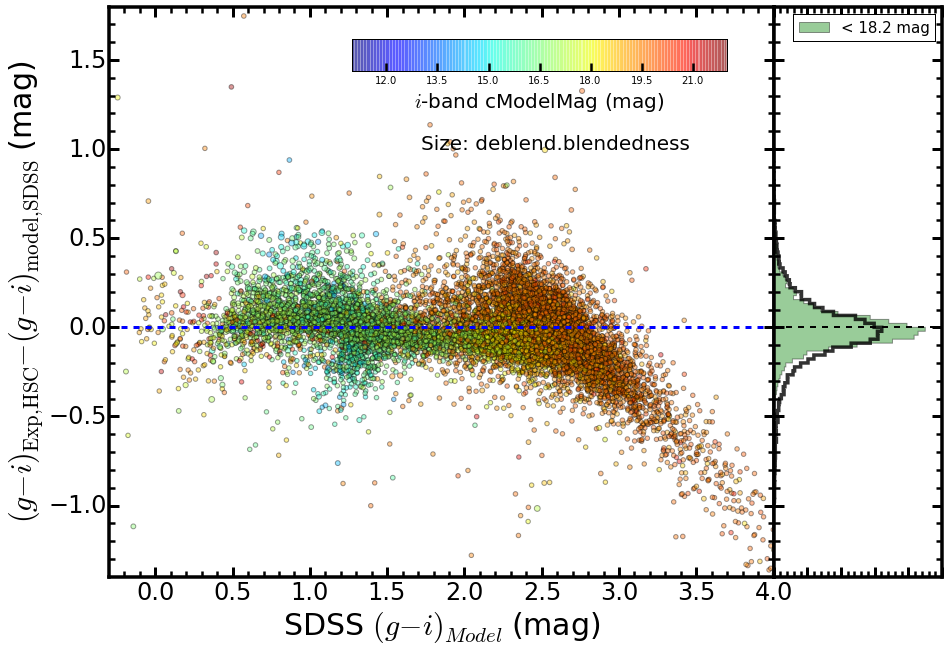

In [27]:
xplot = gamaMatch['modelMag_g'] - gamaMatch['modelMag_i'] 
yplot = gamaMatch['gmag_cmodel_exp'] - gamaMatch['a_g'] - \
        gamaMatch['imag_cmodel_exp'] + gamaMatch['a_i']
carr  = gamaMatch['cmodelMag_i']
sarr  = gamaMatch['ir_deblend_blendedness']

fig = plt.figure(figsize=(13, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# 
xuse = xplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
yuse = yplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
xuseErr = xerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
yuseErr = yerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
cuse = carr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]
suse = sarr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse, (yuse - xuse), c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=11.0, vmax=22.0)

# Color bar 
cax = fig.add_axes([0.36, 0.88, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('$i$-band cModelMag (mag)', fontsize=20)

ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(0.0, linestyle='dashed', linewidth=3.0)
# Vertical line
ax1.axvline(18.2, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('SDSS $(g-i)_{Model}$ (mag)',  size=30)
ax1.set_ylabel('$(g-i)_{\mathrm{Exp, HSC}}-(g-i)_{\mathrm{model, SDSS}}$ (mag)', size=30)
# Axis limits
ax1.set_xlim(-0.3, 4.0)
ax1.set_ylim(-1.4, 1.8)

# ---------------------------------------------------------------------------
# Histogram 
xbright = xuse[cuse < 18.2]
ybright = yuse[cuse < 18.2]
n, bins, patches=ax2.hist((ybright-xbright), bins=90, range=[-1.0, 1.0], 
                             orientation='horizontal', histtype='stepfilled', 
                             color='g', alpha=0.4, normed=1, label='< 18.2 mag')
n, bins, patches=ax2.hist((yuse-xuse), bins=90, range=[-1.0, 1.0], 
                             orientation='horizontal', histtype='step', 
                             color='k', alpha=0.8, normed=1, linewidth=3.5)

ax2.set_ylim(ax1.get_ylim())

ax2.legend(fontsize=15)

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

#ax2.axhline(medMagDiff1a, color='b', linestyle='-', linewidth=3, alpha=0.4)
ax2.axhline(0.0, color='k', linewidth=2, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('hsc_gama_model_gi_1.png', dpi=90)

### Relation with redshift

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:14: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:14: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:16: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:16: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:18: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:18: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:20: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:20: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:22: Run

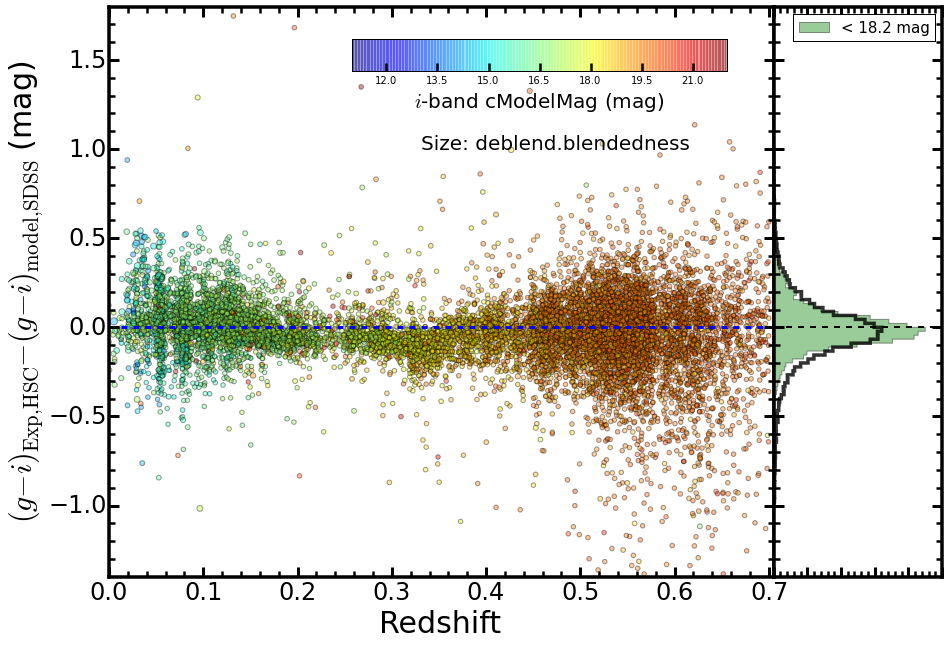

In [26]:
xplot = gamaMatch['modelMag_g'] - gamaMatch['modelMag_i'] 
yplot = gamaMatch['gmag_cmodel_exp'] - gamaMatch['a_g'] - \
        gamaMatch['imag_cmodel_exp'] + gamaMatch['a_i']
carr  = gamaMatch['cmodelMag_i']
sarr  = gamaMatch['ir_deblend_blendedness']
redshift = gamaMatch['z_use']

fig = plt.figure(figsize=(13, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# 
xuse = xplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
yuse = yplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
xuseErr = xerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
yuseErr = yerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
cuse = carr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]
suse = sarr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]
zuse = redshift[(carr > 10.0) & (carr < 22.0) & 
                (carr > 10.0) & (carr < 22.0)]

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(zuse, (yuse - xuse), c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=11.0, vmax=22.0)

# Color bar 
cax = fig.add_axes([0.36, 0.88, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('$i$-band cModelMag (mag)', fontsize=20)

ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(0.0, linestyle='dashed', linewidth=3.0)
# Vertical line
ax1.axvline(18.2, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('Redshift',  size=30)
ax1.set_ylabel('$(g-i)_{\mathrm{Exp, HSC}}-(g-i)_{\mathrm{model, SDSS}}$ (mag)', size=30)
# Axis limits
ax1.set_xlim(0.00, 0.705)
ax1.set_ylim(-1.4, 1.8)

# ---------------------------------------------------------------------------
# Histogram 
xbright = xuse[cuse < 18.2]
ybright = yuse[cuse < 18.2]
n, bins, patches=ax2.hist((ybright-xbright), bins=90, range=[-1.0, 1.0], 
                             orientation='horizontal', histtype='stepfilled', 
                             color='g', alpha=0.4, normed=1, label='< 18.2 mag')
n, bins, patches=ax2.hist((yuse-xuse), bins=90, range=[-1.0, 1.0], 
                             orientation='horizontal', histtype='step', 
                             color='k', alpha=0.8, normed=1, linewidth=3.5)

ax2.set_ylim(ax1.get_ylim())

ax2.legend(fontsize=15)

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

#ax2.axhline(medMagDiff1a, color='b', linestyle='-', linewidth=3, alpha=0.4)
ax2.axhline(0.0, color='k', linewidth=2, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('hsc_gama_model_gi_2.png', dpi=90)

## (r-z) Color using Exp Models

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:21: Run

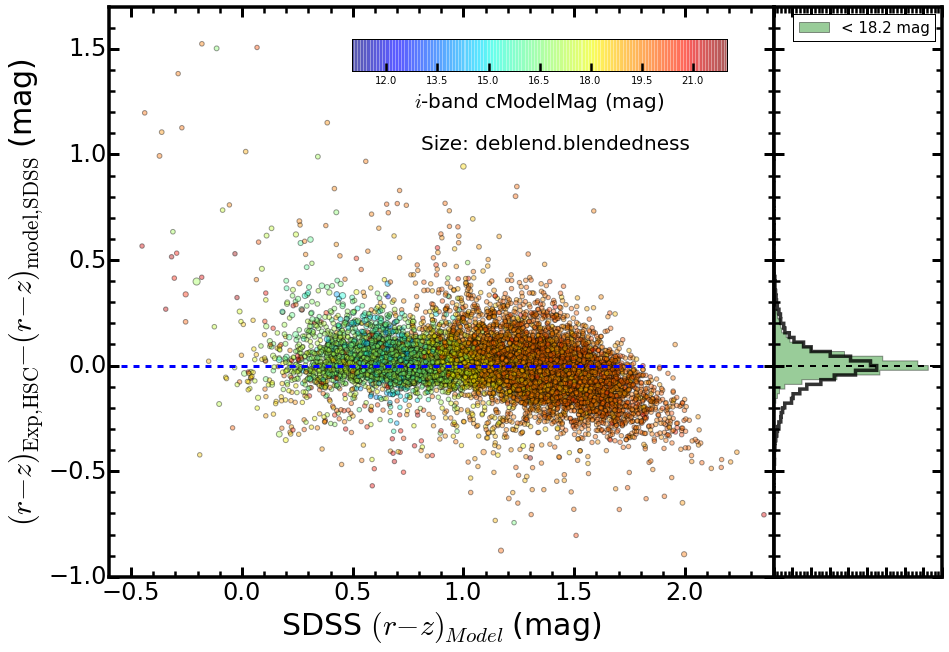

In [24]:
xplot = gamaMatch['modelMag_r'] - gamaMatch['modelMag_z'] 
yplot = gamaMatch['rmag_cmodel_exp'] - gamaMatch['a_r'] - \
        gamaMatch['zmag_cmodel_exp'] + gamaMatch['a_z']
carr  = gamaMatch['cmodelMag_i']
sarr  = gamaMatch['ir_deblend_blendedness']

fig = plt.figure(figsize=(13, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# 
xuse = xplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
yuse = yplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
xuseErr = xerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
yuseErr = yerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
cuse = carr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]
suse = sarr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse, (yuse - xuse), c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=11.0, vmax=22.0)

# Color bar 
cax = fig.add_axes([0.36, 0.88, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('$i$-band cModelMag (mag)', fontsize=20)

ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(0.0, linestyle='dashed', linewidth=3.0)
# Vertical line
ax1.axvline(18.2, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('SDSS $(r-z)_{Model}$ (mag)',  size=30)
ax1.set_ylabel('$(r-z)_{\mathrm{Exp, HSC}}-(r-z)_{\mathrm{model, SDSS}}$ (mag)', size=30)
# Axis limits
ax1.set_xlim(-0.6, 2.4)
ax1.set_ylim(-1.0, 1.7)

# ---------------------------------------------------------------------------
# Histogram 
xbright = xuse[cuse < 18.2]
ybright = yuse[cuse < 18.2]
n, bins, patches=ax2.hist((ybright-xbright), bins=90, range=[-1.0, 1.0], 
                             orientation='horizontal', histtype='stepfilled', 
                             color='g', alpha=0.4, normed=1, label='< 18.2 mag')
n, bins, patches=ax2.hist((yuse-xuse), bins=90, range=[-1.0, 1.0], 
                             orientation='horizontal', histtype='step', 
                             color='k', alpha=0.8, normed=1, linewidth=3.5)

ax2.set_ylim(ax1.get_ylim())

ax2.legend(fontsize=15)

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

#ax2.axhline(medMagDiff1a, color='b', linestyle='-', linewidth=3, alpha=0.4)
ax2.axhline(0.0, color='k', linewidth=2, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('hsc_gama_model_rz_1.png', dpi=90)

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:21: Run

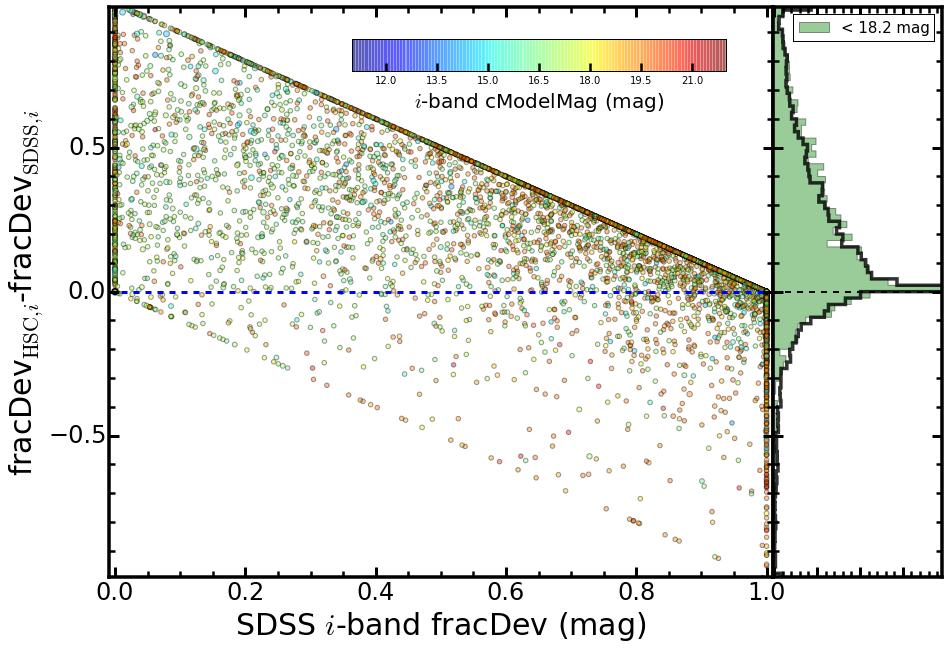

In [36]:
xplot = gamaMatch['fracDev_i'] 
yplot = gamaMatch['im_cmodel_fracdev']
carr  = gamaMatch['cmodelMag_i']
sarr  = gamaMatch['ir_deblend_blendedness']

fig = plt.figure(figsize=(13, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# 
xuse = xplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
yuse = yplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
xuseErr = xerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
yuseErr = yerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
cuse = carr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]
suse = sarr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse, (yuse - xuse), c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=11.0, vmax=22.0)

# Color bar 
cax = fig.add_axes([0.36, 0.88, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('$i$-band cModelMag (mag)', fontsize=20)

#ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
#         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(0.0, linestyle='dashed', linewidth=3.0)
# Vertical line
ax1.axvline(18.2, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('SDSS $i$-band fracDev (mag)',  size=30)
ax1.set_ylabel('fracDev$_{\mathrm{HSC}, i}$-fracDev$_{\mathrm{SDSS}, i}$', size=30)
# Axis limits
ax1.set_xlim(-0.01, 1.01)
ax1.set_ylim(-0.99, 0.99)

# ---------------------------------------------------------------------------
# Histogram 
xbright = xuse[cuse < 18.2]
ybright = yuse[cuse < 18.2]
n, bins, patches=ax2.hist((ybright-xbright), bins=90, range=[-1.0, 1.0], 
                             orientation='horizontal', histtype='stepfilled', 
                             color='g', alpha=0.4, normed=1, label='< 18.2 mag')
n, bins, patches=ax2.hist((yuse-xuse), bins=90, range=[-1.0, 1.0], 
                             orientation='horizontal', histtype='step', 
                             color='k', alpha=0.8, normed=1, linewidth=3.5)

ax2.set_ylim(ax1.get_ylim())
ax2.set_xlim(-0.01, 1.95)

ax2.legend(fontsize=15)

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

#ax2.axhline(medMagDiff1a, color='b', linestyle='-', linewidth=3, alpha=0.4)
ax2.axhline(0.0, color='k', linewidth=2, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('hsc_gama_fracDev_1.png', dpi=90)

# Shape and Size 

## i-band axis ratio using Exp model

In [27]:
# Exp
e1exp = (gamaMatch['im_cmodel_exp_ixx'] - gamaMatch['im_cmodel_exp_iyy']) / \
        (gamaMatch['im_cmodel_exp_ixx'] + gamaMatch['im_cmodel_exp_iyy'])
e2exp = (2.0 * gamaMatch['im_cmodel_exp_ixy']) / \
        (gamaMatch['im_cmodel_exp_ixx'] + gamaMatch['im_cmodel_exp_iyy'])
r2exp = np.sqrt(gamaMatch['im_cmodel_exp_ixx'] + gamaMatch['im_cmodel_exp_iyy'])

baExpHsc = 1.0 - np.sqrt(e1exp ** 2.0 + e2exp ** 2.0)
reExpHsc = r2exp * 0.168

# Dev
e1dev = (gamaMatch['im_cmodel_dev_ixx'] - gamaMatch['im_cmodel_dev_iyy']) / \
        (gamaMatch['im_cmodel_dev_ixx'] + gamaMatch['im_cmodel_dev_iyy'])
e2dev = (2.0 * gamaMatch['im_cmodel_dev_ixy']) / \
        (gamaMatch['im_cmodel_dev_ixx'] + gamaMatch['im_cmodel_dev_iyy'])
r2dev = np.sqrt(gamaMatch['im_cmodel_dev_ixx'] + gamaMatch['im_cmodel_dev_iyy'])

baDevHsc = 1.0 - np.sqrt(e1dev ** 2.0 + e2dev ** 2.0)
reDevHsc = r2dev * 0.168

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:21: Run

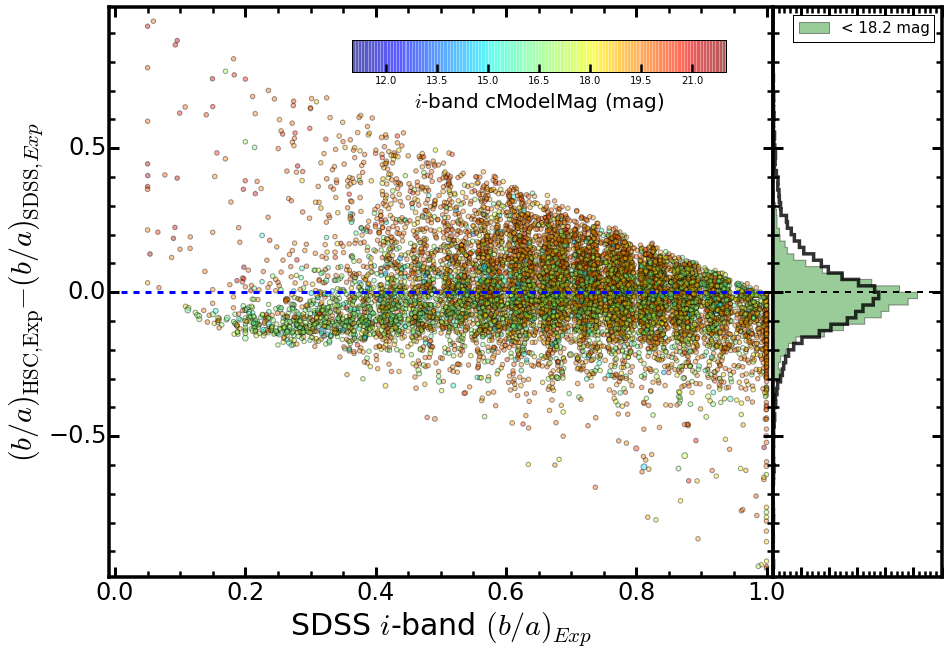

In [35]:
xplot = gamaMatch['expAB_i']
yplot = baExpHsc
carr  = gamaMatch['cmodelMag_i']
sarr  = gamaMatch['ir_deblend_blendedness']

fig = plt.figure(figsize=(13, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# 
xuse = xplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
yuse = yplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
xuseErr = xerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
yuseErr = yerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
cuse = carr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]
suse = sarr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse, (yuse - xuse), c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=11.0, vmax=22.0)

# Color bar 
cax = fig.add_axes([0.36, 0.88, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('$i$-band cModelMag (mag)', fontsize=20)

#ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
#         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(0.0, linestyle='dashed', linewidth=3.0)
# Vertical line
ax1.axvline(18.2, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('SDSS $i$-band $(b/a)_{Exp}$',  size=30)
ax1.set_ylabel('$(b/a)_{\mathrm{HSC, Exp}}-(b/a)_{\mathrm{SDSS}, Exp}$', size=30)
# Axis limits
ax1.set_xlim(-0.01, 1.01)
ax1.set_ylim(-0.99, 0.99)

# ---------------------------------------------------------------------------
# Histogram 
xbright = xuse[cuse < 18.2]
ybright = yuse[cuse < 18.2]
n, bins, patches=ax2.hist((ybright-xbright), bins=90, range=[-1.0, 1.0], 
                             orientation='horizontal', histtype='stepfilled', 
                             color='g', alpha=0.4, normed=1, label='< 18.2 mag')
n, bins, patches=ax2.hist((yuse-xuse), bins=90, range=[-1.0, 1.0], 
                             orientation='horizontal', histtype='step', 
                             color='k', alpha=0.8, normed=1, linewidth=3.5)

ax2.set_ylim(ax1.get_ylim())

ax2.legend(fontsize=15)

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

#ax2.axhline(medMagDiff1a, color='b', linestyle='-', linewidth=3, alpha=0.4)
ax2.axhline(0.0, color='k', linewidth=2, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('hsc_gama_baExp_1.png', dpi=90)

## i-band axis ratio using DeV model

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:21: Run

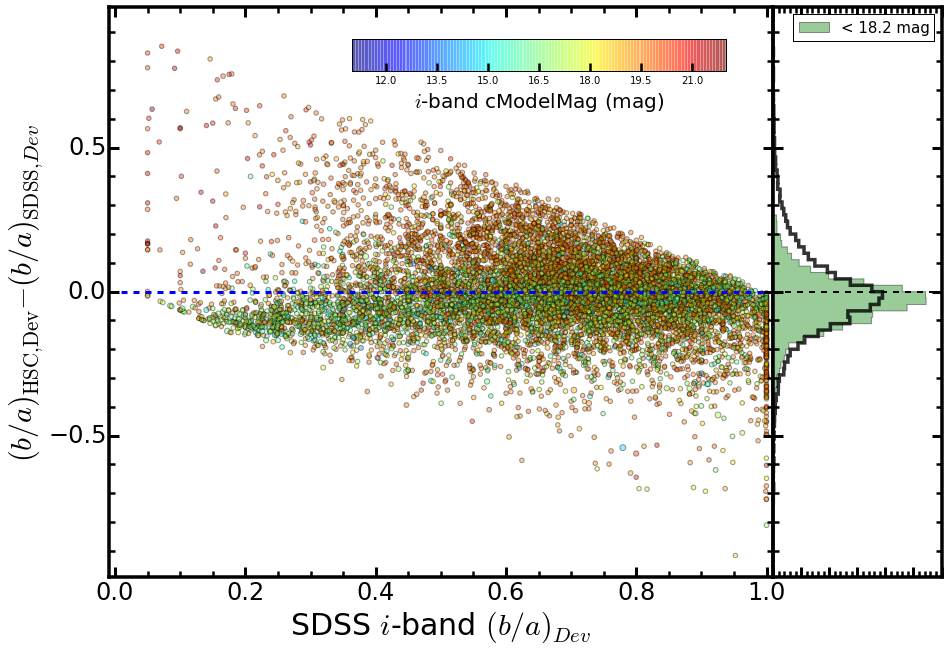

In [34]:
xplot = gamaMatch['devAB_i']
yplot = baDevHsc
carr  = gamaMatch['cmodelMag_i']
sarr  = gamaMatch['ir_deblend_blendedness']

fig = plt.figure(figsize=(13, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# 
xuse = xplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
yuse = yplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
xuseErr = xerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
yuseErr = yerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
cuse = carr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]
suse = sarr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse, (yuse - xuse), c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=11.0, vmax=22.0)

# Color bar 
cax = fig.add_axes([0.36, 0.88, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('$i$-band cModelMag (mag)', fontsize=20)

#ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
#         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(0.0, linestyle='dashed', linewidth=3.0)
# Vertical line
ax1.axvline(18.2, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('SDSS $i$-band $(b/a)_{Dev}$',  size=30)
ax1.set_ylabel('$(b/a)_{\mathrm{HSC, Dev}}-(b/a)_{\mathrm{SDSS}, Dev}$', size=30)
# Axis limits
ax1.set_xlim(-0.01, 1.01)
ax1.set_ylim(-0.99, 0.99)

# ---------------------------------------------------------------------------
# Histogram 
xbright = xuse[cuse < 18.2]
ybright = yuse[cuse < 18.2]
n, bins, patches=ax2.hist((ybright-xbright), bins=90, range=[-1.0, 1.0], 
                             orientation='horizontal', histtype='stepfilled', 
                             color='g', alpha=0.4, normed=1, label='< 18.2 mag')
n, bins, patches=ax2.hist((yuse-xuse), bins=90, range=[-1.0, 1.0], 
                             orientation='horizontal', histtype='step', 
                             color='k', alpha=0.8, normed=1, linewidth=3.5)

ax2.set_ylim(ax1.get_ylim())

ax2.legend(fontsize=15)

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

#ax2.axhline(medMagDiff1a, color='b', linestyle='-', linewidth=3, alpha=0.4)
ax2.axhline(0.0, color='k', linewidth=2, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('hsc_gama_baDev_1.png', dpi=90)

## Comparison of Size 

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:21: Run

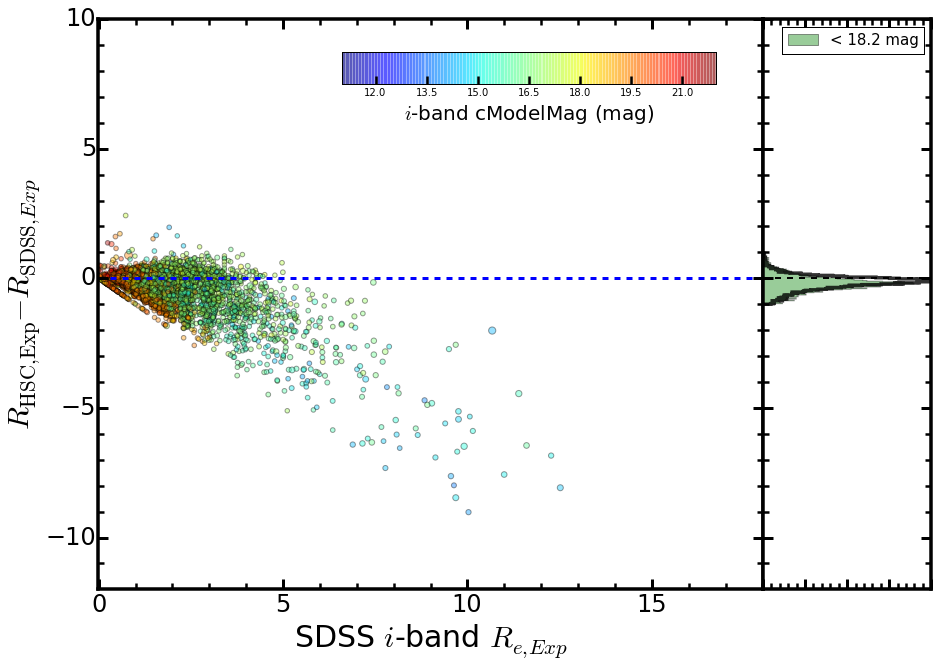

In [30]:
xplot = gamaMatch['expRad_i']
yplot = reExpHsc
carr  = gamaMatch['cmodelMag_i']
sarr  = gamaMatch['ir_deblend_blendedness']

fig = plt.figure(figsize=(13, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# 
xuse = xplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
yuse = yplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
xuseErr = xerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
yuseErr = yerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
cuse = carr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]
suse = sarr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse, (yuse - xuse), c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=11.0, vmax=22.0)

# Color bar 
cax = fig.add_axes([0.36, 0.88, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('$i$-band cModelMag (mag)', fontsize=20)

#ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
#         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(0.0, linestyle='dashed', linewidth=3.0)
# Vertical line
ax1.axvline(18.2, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('SDSS $i$-band $R_{e, Exp}$',  size=30)
ax1.set_ylabel('$R_{\mathrm{HSC, Exp}}-R_{\mathrm{SDSS}, Exp}$', size=30)
# Axis limits
ax1.set_xlim(-0.01, 18.01)
ax1.set_ylim(-12.0, 10.0)

# ---------------------------------------------------------------------------
# Histogram 
xbright = xuse[cuse < 18.2]
ybright = yuse[cuse < 18.2]
n, bins, patches=ax2.hist((ybright-xbright), bins=90, range=[-1.0, 1.0], 
                             orientation='horizontal', histtype='stepfilled', 
                             color='g', alpha=0.4, normed=1, label='< 18.2 mag')
n, bins, patches=ax2.hist((yuse-xuse), bins=90, range=[-1.0, 1.0], 
                             orientation='horizontal', histtype='step', 
                             color='k', alpha=0.8, normed=1, linewidth=3.5)

ax2.set_ylim(ax1.get_ylim())

ax2.legend(fontsize=15)

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

#ax2.axhline(medMagDiff1a, color='b', linestyle='-', linewidth=3, alpha=0.4)
ax2.axhline(0.0, color='k', linewidth=2, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('hsc_gama_expR_1.png', dpi=90)

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:17: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:19: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:21: Run

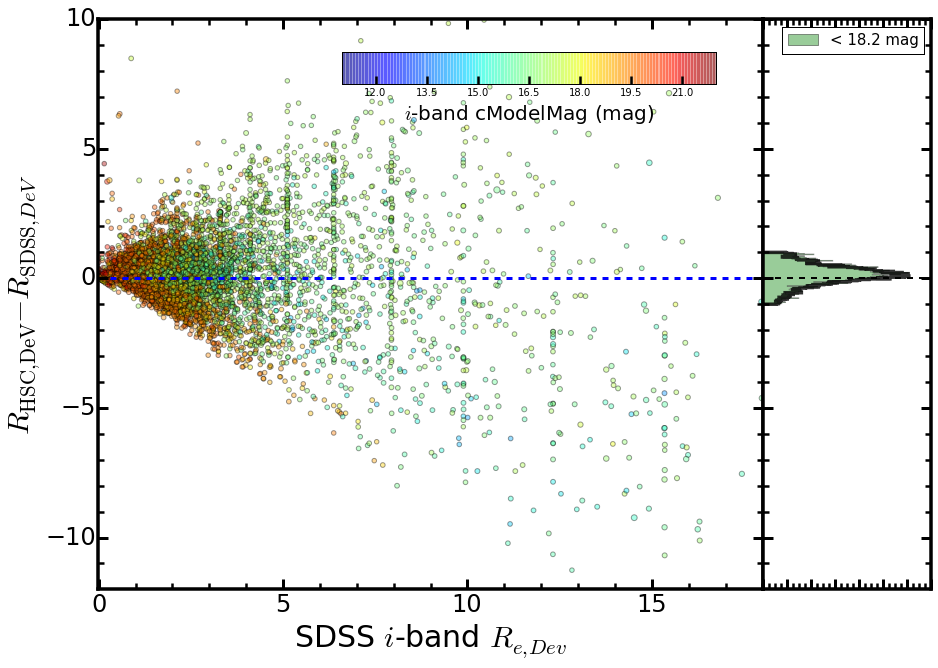

In [33]:
xplot = gamaMatch['devRad_i']
yplot = reDevHsc
carr  = gamaMatch['cmodelMag_i']
sarr  = gamaMatch['ir_deblend_blendedness']

fig = plt.figure(figsize=(13, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# 
xuse = xplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
yuse = yplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
xuseErr = xerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
yuseErr = yerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
cuse = carr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]
suse = sarr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse, (yuse - xuse), c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=11.0, vmax=22.0)

# Color bar 
cax = fig.add_axes([0.36, 0.88, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('$i$-band cModelMag (mag)', fontsize=20)

#ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
#         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(0.0, linestyle='dashed', linewidth=3.0)
# Vertical line
ax1.axvline(18.2, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('SDSS $i$-band $R_{e, Dev}$',  size=30)
ax1.set_ylabel('$R_{\mathrm{HSC, DeV}}-R_{\mathrm{SDSS}, DeV}$', size=30)
# Axis limits
ax1.set_xlim(-0.01, 18.01)
ax1.set_ylim(-12.0, 10.0)

# ---------------------------------------------------------------------------
# Histogram 
xbright = xuse[cuse < 18.2]
ybright = yuse[cuse < 18.2]
n, bins, patches=ax2.hist((ybright-xbright), bins=90, range=[-1.0, 1.0], 
                             orientation='horizontal', histtype='stepfilled', 
                             color='g', alpha=0.4, normed=1, label='< 18.2 mag')
n, bins, patches=ax2.hist((yuse-xuse), bins=90, range=[-1.0, 1.0], 
                             orientation='horizontal', histtype='step', 
                             color='k', alpha=0.8, normed=1, linewidth=3.5)

ax2.set_ylim(ax1.get_ylim())

ax2.legend(fontsize=15)

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

#ax2.axhline(medMagDiff1a, color='b', linestyle='-', linewidth=3, alpha=0.4)
ax2.axhline(0.0, color='k', linewidth=2, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('hsc_gama_devR_1.png', dpi=90)

# Redshift Distribution

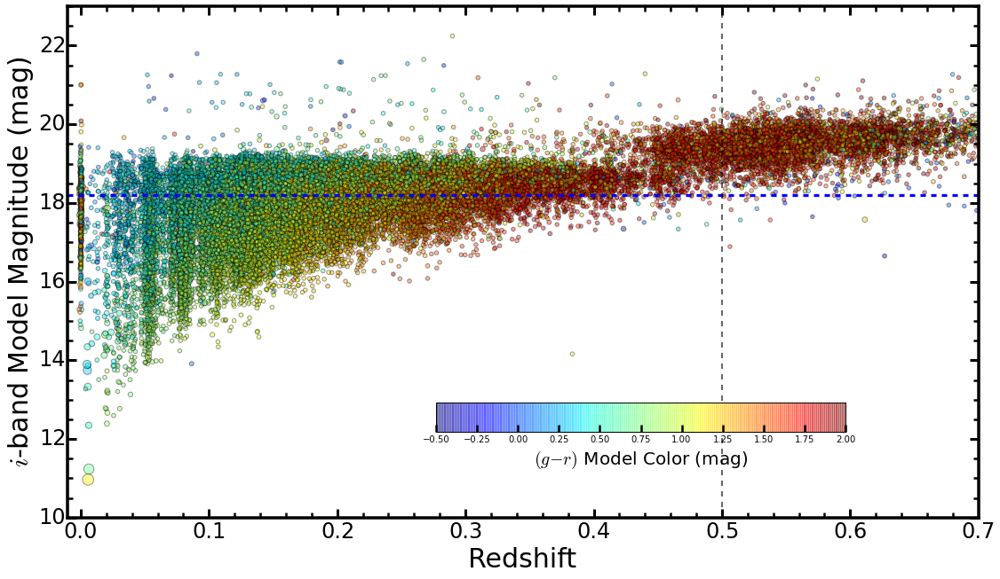

In [306]:
xplot = gamaMatch['z_use']
yplot = gamaMatch['modelMag_i']
carr  = gamaMatch['modelMag_g'] - gamaMatch['modelMag_r']
sarr  = gamaMatch['ir_deblend_blendedness']

fig = plt.figure(figsize=(16, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.10, 0.10, 0.89, 0.89]
ax1 = plt.axes(rec)
#ax2 = plt.axes(recHist)

# 
xuse = xplot
yuse = yplot
cuse = carr
suse = sarr

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse, yuse, c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=-0.5, vmax=2.0)

# Color bar 
cax = fig.add_axes([0.46, 0.25, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('$(g-r)$ Model Color (mag)', fontsize=20)

#ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
#         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(18.2, linestyle='dashed', linewidth=3.2, color='b')
# Vertical line
ax1.axvline(0.5, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('Redshift',  size=30)
ax1.set_ylabel('$i$-band Model Magnitude (mag)', size=30)
# Axis limits
ax1.set_xlim(-0.01, 0.70)
ax1.set_ylim(10.0, 23.0)

fig.savefig('hsc_gama_z_imag_1.png', dpi=90)

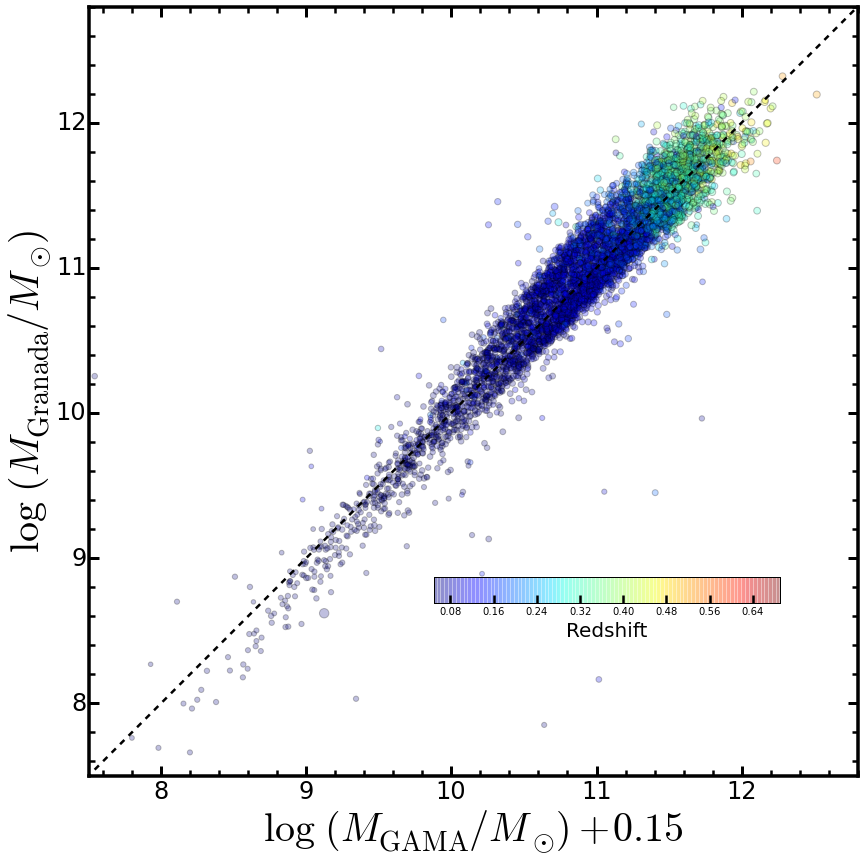

In [317]:
xplot = gamaMatch['logms_gama']
yplot = gamaMatch['logms_gran']
carr  = gamaMatch['z_use']
sarr  = gamaMatch['modelMag_g'] - gamaMatch['modelMag_r']

fig = plt.figure(figsize=(12, 12))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.10, 0.10, 0.89, 0.89]
ax1 = plt.axes(rec)
#ax2 = plt.axes(recHist)

# 
xuse = xplot
yuse = yplot
cuse = carr
suse = sarr

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse+0.15, yuse, c=cuse, s=(1.5 + suse) * 15.0, alpha=0.25, 
                label='Matched', vmin=0.05, vmax=0.69)

# Color bar 
cax = fig.add_axes([0.50, 0.30, 0.4, 0.03]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('Redshift', fontsize=20)

#ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
#         transform = ax1.transAxes)

# One to one line 
ax1.plot(np.linspace(5, 23, 100), np.linspace(5, 23, 100), 
         linestyle='dashed', color='k', linewidth=2.5)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\log\ (M_{\mathrm{GAMA}}/M_{\odot}) + 0.15$',  size=40)
ax1.set_ylabel('$\log\ (M_{\mathrm{Granada}}/M_{\odot})$', size=40)
# Axis limits
ax1.set_xlim(7.5, 12.80)
ax1.set_ylim(7.5, 12.80)

fig.savefig('hsc_gama_logms_1.png', dpi=90)

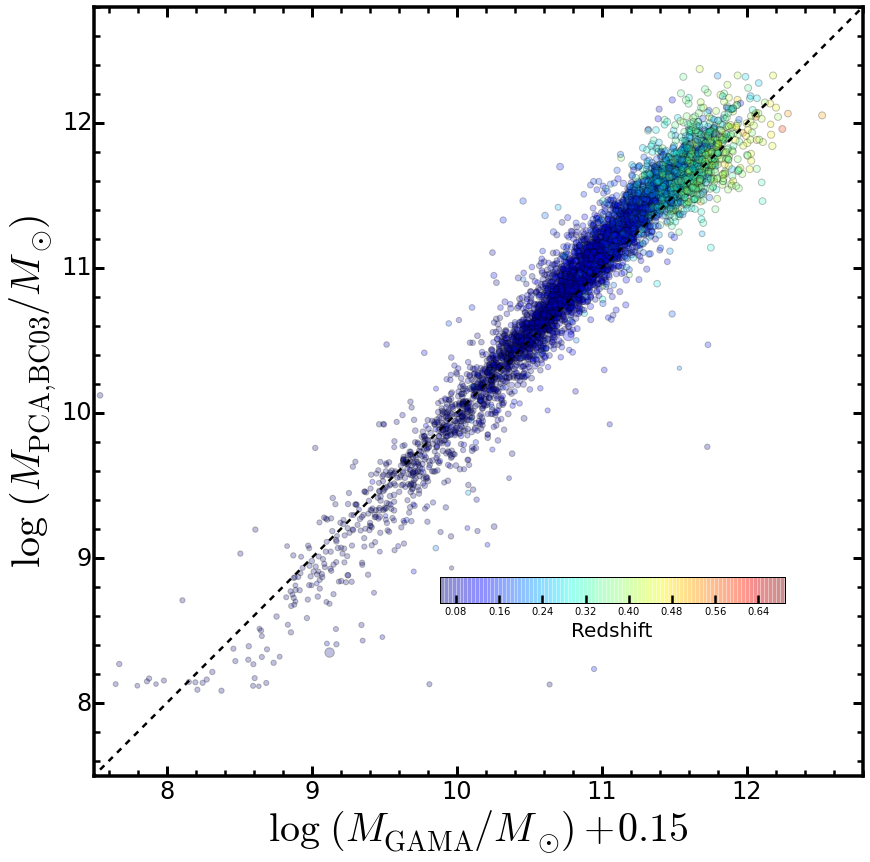

In [318]:
xplot = gamaMatch['logms_gama']
yplot = gamaMatch['logms_pca']
carr  = gamaMatch['z_use']
sarr  = gamaMatch['modelMag_g'] - gamaMatch['modelMag_r']

fig = plt.figure(figsize=(12, 12))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.10, 0.10, 0.89, 0.89]
ax1 = plt.axes(rec)
#ax2 = plt.axes(recHist)

# 
xuse = xplot
yuse = yplot
cuse = carr
suse = sarr

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse+0.15, yuse, c=cuse, s=(1.5 + suse) * 15.0, alpha=0.25, 
                label='Matched', vmin=0.05, vmax=0.69)

# Color bar 
cax = fig.add_axes([0.50, 0.30, 0.4, 0.03]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('Redshift', fontsize=20)

#ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
#         transform = ax1.transAxes)

# One to one line 
ax1.plot(np.linspace(5, 23, 100), np.linspace(5, 23, 100), 
         linestyle='dashed', color='k', linewidth=2.5)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('$\log\ (M_{\mathrm{GAMA}}/M_{\odot}) + 0.15$',  size=40)
ax1.set_ylabel('$\log\ (M_{\mathrm{PCA, BC03}}/M_{\odot})$', size=40)
# Axis limits
ax1.set_xlim(7.5, 12.80)
ax1.set_ylim(7.5, 12.80)

fig.savefig('hsc_gama_logms_2.png', dpi=90)

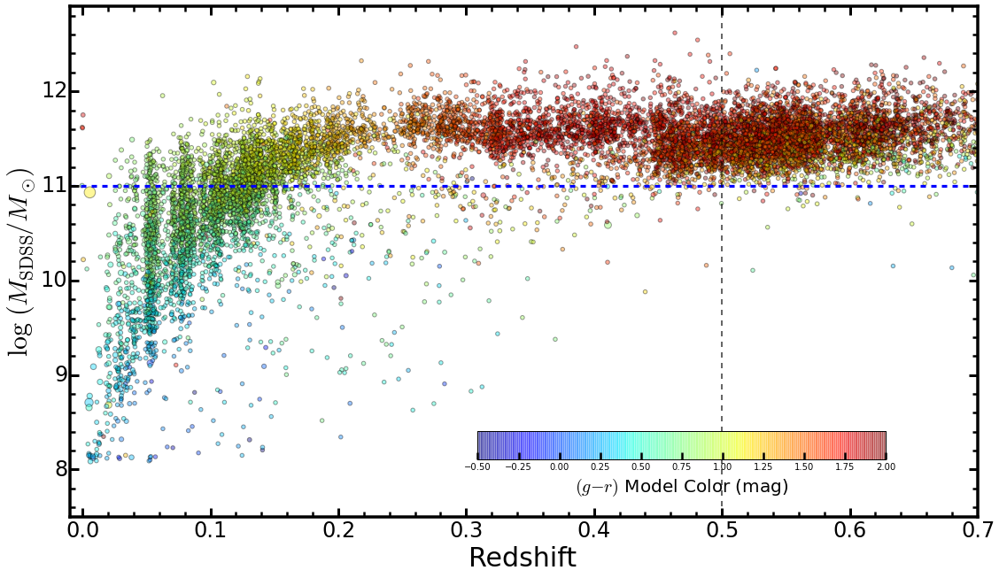

In [321]:
xplot = gamaMatch['z_use']
yplot = gamaMatch['logms_pca']
carr  = gamaMatch['modelMag_g'] - gamaMatch['modelMag_r']
sarr  = gamaMatch['ir_deblend_blendedness']

fig = plt.figure(figsize=(16, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.10, 0.10, 0.89, 0.89]
ax1 = plt.axes(rec)
#ax2 = plt.axes(recHist)

# 
xuse = xplot
yuse = yplot
cuse = carr
suse = sarr

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse, yuse, c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=-0.5, vmax=2.0)

# Color bar 
cax = fig.add_axes([0.50, 0.20, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('$(g-r)$ Model Color (mag)', fontsize=20)

#ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
#         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(11.0, linestyle='dashed', linewidth=3.2, color='b')
# Vertical line
ax1.axvline(0.5, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('Redshift',  size=30)
ax1.set_ylabel('$\log\ (M_{\mathrm{SDSS}}/M_{\odot})$', size=30)
# Axis limits
ax1.set_xlim(-0.01, 0.70)
ax1.set_ylim(7.5, 12.9)

fig.savefig('hsc_gama_z_logms_1.png', dpi=90)

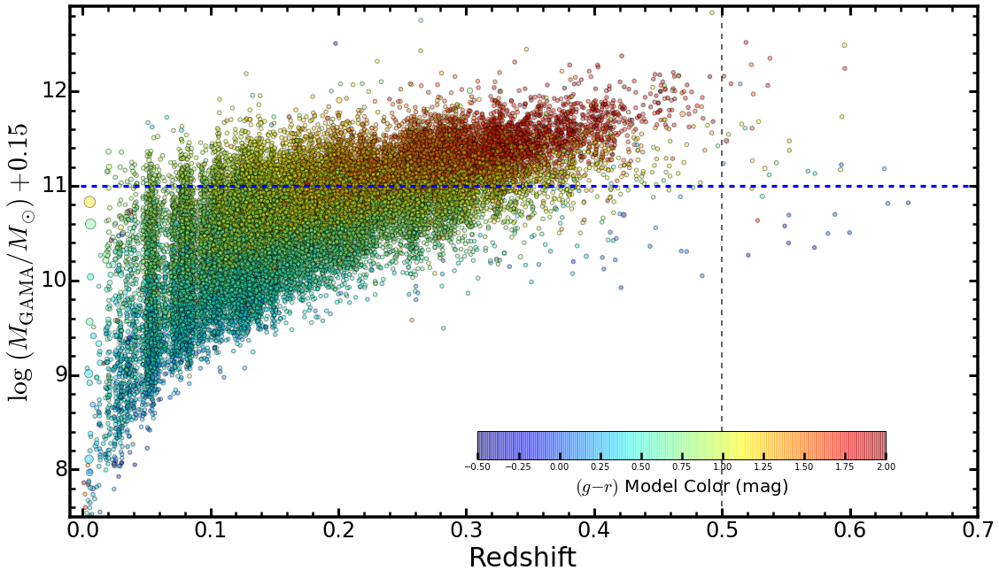

In [323]:
xplot = gamaMatch['z_use']
yplot = gamaMatch['logms_gama']
carr  = gamaMatch['modelMag_g'] - gamaMatch['modelMag_r']
sarr  = gamaMatch['ir_deblend_blendedness']

fig = plt.figure(figsize=(16, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.10, 0.10, 0.89, 0.89]
ax1 = plt.axes(rec)
#ax2 = plt.axes(recHist)

# 
xuse = xplot
yuse = yplot
cuse = carr
suse = sarr

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse, yuse+0.15, c=cuse, s=(suse + 5) * 4.0, alpha=0.4, 
                label='Matched', vmin=-0.5, vmax=2.0)

# Color bar 
cax = fig.add_axes([0.50, 0.20, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('$(g-r)$ Model Color (mag)', fontsize=20)

#ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
#         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(11.0, linestyle='dashed', linewidth=3.2, color='b')
# Vertical line
ax1.axvline(0.5, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('Redshift',  size=30)
ax1.set_ylabel('$\log\ (M_{\mathrm{GAMA}}/M_{\odot}) + 0.15$', size=30)
# Axis limits
ax1.set_xlim(-0.01, 0.70)
ax1.set_ylim(7.5, 12.9)

fig.savefig('hsc_gama_z_logms_2.png', dpi=90)

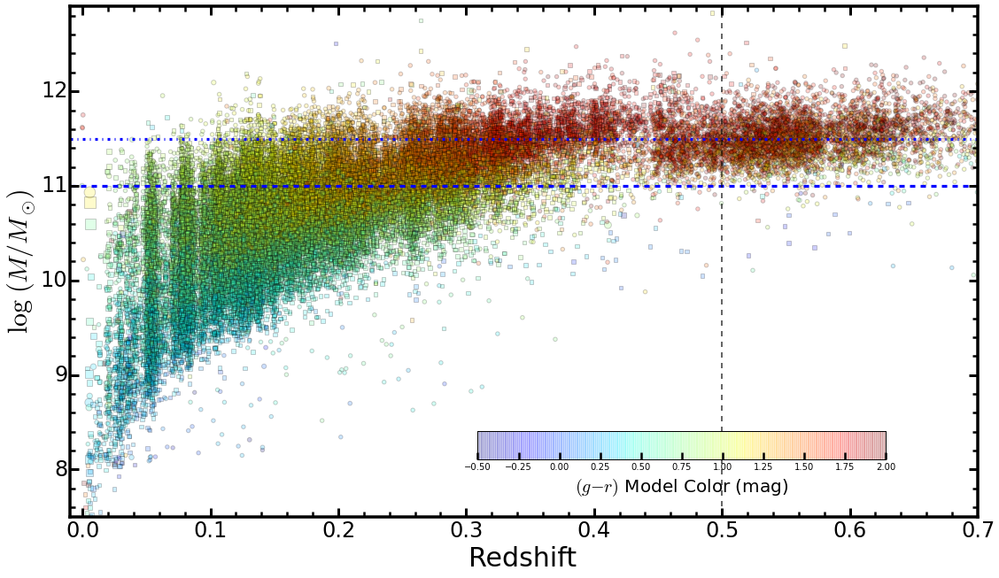

In [326]:
xplot = gamaMatch['z_use']
yplot1 = gamaMatch['logms_pca']
yplot2 = gamaMatch['logms_gama']

carr  = gamaMatch['modelMag_g'] - gamaMatch['modelMag_r']
sarr  = gamaMatch['ir_deblend_blendedness']

fig = plt.figure(figsize=(16, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
rec = [0.10, 0.10, 0.89, 0.89]
ax1 = plt.axes(rec)
#ax2 = plt.axes(recHist)

# 
xuse = xplot
yuse = yplot
cuse = carr
suse = sarr

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse, yplot1, c=cuse, s=(suse + 5) * 4.0, alpha=0.2, 
                label='SDSS', vmin=-0.5, vmax=2.0)
q = ax1.scatter(xuse, yplot2 + 0.15, c=cuse, s=(suse + 5) * 4.0, alpha=0.2, 
                label='GAMA', vmin=-0.5, vmax=2.0, marker='s')

# Color bar 
cax = fig.add_axes([0.50, 0.20, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('$(g-r)$ Model Color (mag)', fontsize=20)

#ax1.text(0.47, 0.75, 'Size: deblend.blendedness', fontsize=20, 
#         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(11.0, linestyle='dashed', linewidth=3.2, color='b')
ax1.axhline(11.5, linestyle='-.', linewidth=3.2, color='b')
# Vertical line
ax1.axvline(0.5, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('Redshift',  size=30)
ax1.set_ylabel('$\log\ (M/M_{\odot})$', size=30)
# Axis limits
ax1.set_xlim(-0.01, 0.70)
ax1.set_ylim(7.5, 12.9)

fig.savefig('hsc_gama_z_logms_3.png', dpi=90)

# Relationship with Deblend.Blendedness

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:14: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:14: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:16: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:16: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:18: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:18: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:20: RuntimeWarning: invalid value encountered in greater
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:20: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:22: Run

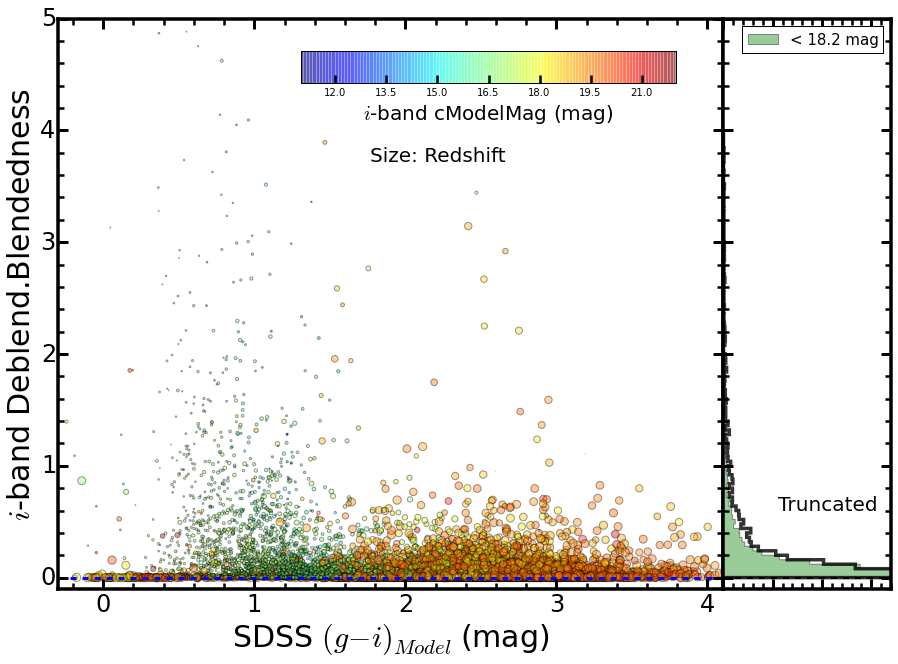

In [40]:
xplot = gamaMatch['modelMag_g'] - gamaMatch['modelMag_i'] 
yplot = gamaMatch['gmag_cmodel_exp'] - gamaMatch['a_g'] - \
        gamaMatch['imag_cmodel_exp'] + gamaMatch['a_i']
carr  = gamaMatch['cmodelMag_i']
sarr  = gamaMatch['ir_deblend_blendedness']
redshift = gamaMatch['z_use']

fig = plt.figure(figsize=(13, 9))
#fig.subplots_adjust(left=0.1, right=0.95, bottom=0.15)
ax1 = plt.axes(recScat)
ax2 = plt.axes(recHist)

# 
xuse = xplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
yuse = yplot[(carr > 10.0) & (carr < 22.0) & 
             (carr > 10.0) & (carr < 22.0)]
xuseErr = xerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
yuseErr = yerr[(carr > 10.0) & (carr < 22.0) & 
               (carr > 10.0) & (carr < 22.0)]
cuse = carr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]
suse = sarr[(carr > 10.0) & (carr < 22.0) & 
            (carr > 10.0) & (carr < 22.0)]
zuse = redshift[(carr > 10.0) & (carr < 22.0) & 
                (carr > 10.0) & (carr < 22.0)]

# ---------------------------------------------------------------------------
# Scatter plot

# Matched ones 
p = ax1.scatter(xuse, suse, c=cuse, s=zuse * 100.0, alpha=0.4, 
                label='Matched', vmin=11.0, vmax=22.0)

# Color bar 
cax = fig.add_axes([0.36, 0.88, 0.4, 0.05]) 
cb = plt.colorbar(p, orientation="horizontal", cax=cax)
cb.ax.set_xlabel('$i$-band cModelMag (mag)', fontsize=20)

ax1.text(0.47, 0.75, 'Size: Redshift', fontsize=20, 
         transform = ax1.transAxes)

# Horizontal line 
ax1.axhline(0.0, linestyle='dashed', linewidth=3.0)
# Vertical line
ax1.axvline(18.2, linestyle='dashed', linewidth=2.0, color='k', 
            alpha=0.6)

# Axes setup
#  Minor Ticks on 
ax1.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax1.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax1.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax1.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax1.tick_params('both', length=10, width=3.0, which='major')
ax1.tick_params('both', length=6, width=2.5, which='minor')

# Label
ax1.set_xlabel('SDSS $(g-i)_{Model}$ (mag)',   size=30)
ax1.set_ylabel('$i$-band Deblend.Blendedness', size=30)
# Axis limits
ax1.set_xlim(-0.3, 4.1)
ax1.set_ylim(-0.1, 5.0)

# ---------------------------------------------------------------------------
# Histogram 
sbright = suse[cuse < 18.2]
n, bins, patches=ax2.hist(suse, bins=100, range=[-0.0, 4.0], 
                             orientation='horizontal', histtype='stepfilled', 
                             color='g', alpha=0.4, normed=1, label='< 18.2 mag')
n, bins, patches=ax2.hist(sbright, bins=100, range=[-0.0, 4.0], 
                             orientation='horizontal', histtype='step', 
                             color='k', alpha=0.8, normed=1, linewidth=3.5)

ax2.set_ylim(ax1.get_ylim())
ax2.set_xlim(-0.01, 1.7)
ax2.text(0.55, 0.6, 'Truncated', size=20)

ax2.legend(fontsize=15)

# Axes setup
#  Minor Ticks on 
ax2.minorticks_on()
#  Axes Thickness
for axis in ['top','bottom','left','right']:
  ax2.spines[axis].set_linewidth(3.5)
#  Tick Label Size 
for tick in ax2.xaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
for tick in ax2.yaxis.get_major_ticks():
    tick.label.set_fontsize(24) 
#  Tick Length and Width
ax2.tick_params('both', length=10, width=3.0, which='major')
ax2.tick_params('both', length=6, width=2.5, which='minor')

#ax2.axhline(medMagDiff1a, color='b', linestyle='-', linewidth=3, alpha=0.4)
ax2.axhline(0.0, color='k', linewidth=2, linestyle='--')

ax2.yaxis.set_major_formatter(NullFormatter())
ax2.xaxis.set_major_formatter(NullFormatter())

fig.savefig('hsc_gama_color_blend_1.png', dpi=90)